## 0 · Instalación de dependencias

In [1]:
# Instalar todas las dependencias necesarias para el pipeline.
# Se usa --quiet para reducir el output. Solo es necesario ejecutar esto
# una vez por entorno; en ejecuciones posteriores se puede saltar.
#
# Paquetes principales:xs
#   openeo         → cliente Python para el backend Copernicus Dataspace
#   xarray         → manejo de datos N-dimensionales (cubos de datos)
#   geopandas      → operaciones geoespaciales vectoriales
#   rioxarray      → extensión geoespacial para xarray (CRS, transform)
#   rasterio       → lectura/escritura de GeoTIFFs
#   contextily     → basemaps (imágenes de fondo satelital/OSM)
#   scikit-image   → remuestreo de rasters (resize con interpolación)
#   netcdf4        → motor para leer ficheros NetCDF descargados de OpenEO
%pip install openeo xarray geopandas rioxarray matplotlib contextily rasterio pyproj shapely scikit-image netcdf4 --quiet


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0.1 -> 26.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


## 1 · Imports y funciones auxiliares

In [16]:
# ════════════════════════════════════════════════════════════════════════════
# IMPORTS — Librerías estándar y arquitectura modular
# ════════════════════════════════════════════════════════════════════════════

import sys
import os
from pathlib import Path

# ── sys.path bootstrap ────────────────────────────────────────────────────────
# Busca la carpeta que contiene el paquete 'intertidal' y la añade a sys.path
notebook_root = Path.cwd().resolve()
candidate_roots = [
    notebook_root,
    notebook_root / "Intertidal_analysis",
    notebook_root.parent,
    notebook_root.parent / "Intertidal_analysis",
    notebook_root.parent.parent,
    notebook_root.parent.parent / "Intertidal_analysis",
]
for candidate in candidate_roots:
    if (candidate / "intertidal").is_dir():
        if str(candidate) not in sys.path:
            sys.path.insert(0, str(candidate))
        print(f"✓ Added to sys.path: {candidate}")
        break
else:
    raise ModuleNotFoundError("No se encontró la carpeta del paquete 'intertidal'")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import geopandas as gpd
import xarray as xr
import rasterio
import contextily as ctx
import openeo

# Clases del paquete modular
from intertidal.geometry import GeometryProcessor
from intertidal.raster import RasterProcessor
from intertidal.openeo_client import OpenEOClient
from intertidal.scl_processor import SCLProcessor
from intertidal.mapper import IntertidalMapper
from intertidal.tide_analyzer import TideAnalyzer
from intertidal.visualization import Visualizer

# Adaptadores de compatibilidad
from intertidal.notebook_compat import (
    CoordinateUtils,
    OpenEOManager,
    download_date_rgb,
    download_date_scl,
    tif_to_rgb,
    tif_to_scl,
    compute_scl_stats,
    load_scl_stack,
    build_reference_map,
    compute_transition_cloud_stats,
    plot_scl_map,
    plot_reference_map,
    plot_rgb_grid,
    plot_water_frequency,
    download_reference_map_openeo,
    load_reference_map_tif,
    evaluate_transition_cloud_coverage_openeo,
    quantify_reference_gain,
    compute_water_frequency_openeo,
    get_water_centroid,
)

# Módulo de modelos de marea (ahora dentro del paquete intertidal)
from intertidal.tidemodel import PyTMDTideModel, CopernicusTideModel

# Compatibilidad: exponer también como módulo top-level `tidemodel`
# para las celdas que hacen `import tidemodel` / `from tidemodel import ...`.
from intertidal import tidemodel as _tidemodel
sys.modules["tidemodel"] = _tidemodel


✓ Added to sys.path: C:\Users\Jorge\sketch_fitton\Intertidal_analysis


## 2 · Configuración

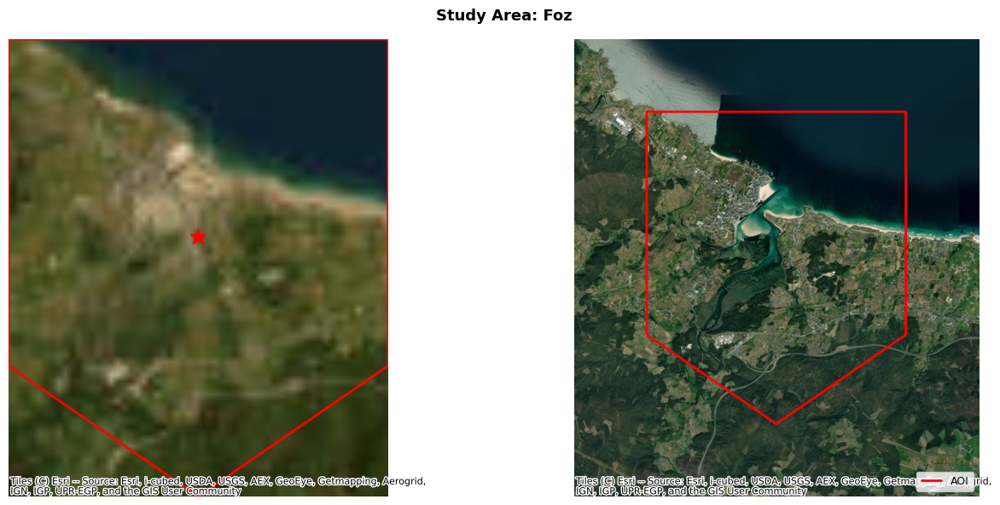

AOI bbox: {'west': -7.285, 'south': 43.519999999999996, 'east': -7.205, 'north': 43.59}
Fechas seleccionadas: 8


In [17]:
# ════════════════════════════════════════════════════════════════════════════
# CONFIGURACIÓN PRINCIPAL — modifica aquí para cambiar de sitio o periodo
# ════════════════════════════════════════════════════════════════════════════

# Nombre del sitio (aparece en títulos de gráficos y ficheros de salida)
site = "Foz"

# ── Intervalo temporal ────────────────────────────────────────────────────────
# Periodo de descarga de las escenas RGB/SCL de muestra (secciones 4-11).
# Se usa también para explorar qué fechas hay disponibles en el backend.
time_extent = ["2020-01-01", "2024-12-31"]

# ── Fechas de muestra a descargar ─────────────────────────────────────────────
# Subconjunto representativo para visualización y análisis exploratorio.
# El Reference Map (sección 12) usa un año completo de forma independiente.
# Tip: ejecuta primero la sección 3 para ver todas las fechas disponibles.
selected_dates = [
    "2024-01-04",   # Invierno
    "2024-03-14",   # Primavera temprana
    "2024-05-28",   # Primavera
    "2024-07-02",   # Verano
    "2024-08-11",   # Verano
    "2024-09-05",   # Finales verano
    "2024-10-30",   # Otoño
    "2024-12-09",   # Invierno
]

# ── Umbral de calidad SCL (filtro global) ─────────────────────────────────────
# Una escena se descarta si el porcentaje de píxeles "malos" supera este valor.
# Este es el filtro estándar (PASO 3). El filtro mejorado por zona de transición
# (PASO 5) puede recuperar escenas que se descartan aquí.
scl_bad_fraction = 0.20  # 20% → descarta si >20% del AOI está nublado/con sombras

# Clases SCL que se consideran "malas" (no aptas para análisis de agua/tierra):
#   3  = sombra de nube       → el clasificador detecta la sombra proyectada
#   8  = nube media prob.     → píxeles probablemente nubosos
#   9  = nube alta prob.      → píxeles muy probablemente nubosos
#  10  = cirrus               → nubes finas de gran altitud
#  11  = nieve/hielo          → puede confundirse con agua en zonas costeras
scl_bad_classes = [3, 8, 9, 10, 11]

# ── Directorios de salida ─────────────────────────────────────────────────────
dir_rgb = "tifs_rgb"   # GeoTIFFs RGB descargados (B04+B03+B02 = R+G+B)
dir_scl = "tifs_scl"   # GeoTIFFs SCL descargados (banda de clasificación)

# Crear las carpetas si no existen (exist_ok=True no falla si ya existen)
os.makedirs(dir_rgb, exist_ok=True)
os.makedirs(dir_scl, exist_ok=True)

# ── AOI — Área de Interés ─────────────────────────────────────────────────────
# Polígono de la Ría de Foz definido mediante coordenadas en formato DMS
# (grados°minutos'segundos"hemisferio).
#
# El polígono tiene 5 vértices en forma de pentágono para aproximar el estuario:
#   - Boca ancha al norte (costa atlántica)
#   - Forma convergente hacia el sur (cabecera del estuario)
aoi_dms = [
    '43°35\'24.00"N 7°17\'6.00"W',   # NW — boca, esquina noroeste
    '43°35\'24.00"N 7°12\'18.00"W',  # NE — boca, esquina noreste (playa de Foz)
    '43°32\'24.00"N 7°12\'18.00"W',  # SE — interior, esquina sureste
    '43°31\'12.00"N 7°14\'42.00"W',  # S  — cabecera del estuario (punto central)
    '43°32\'24.00"N 7°17\'6.00"W',   # SW — interior, esquina suroeste
]

# ── Usar CoordinateUtils para crear geometrías ───────────────────────────────
coords = CoordinateUtils()
polygon = coords.make_polygon(aoi_dms)
bbox = coords.bbox_from_polygon(polygon)

# Sistemas de referencia usados en el pipeline
crs = "EPSG:4326"           # WGS84 geográfico: coordenadas lon/lat en grados
crs_web_mercator = "EPSG:3857"  # Web Mercator: proyección plana en metros (para basemaps)

# ════════════════════════════════════════════════════════════════════════════
# VISUALIZACIÓN CARTOGRÁFICA DEL AOI
# ════════════════════════════════════════════════════════════════════════════
# Se generan dos paneles:
#   Izquierda: vista general de localización (zoom regional)
#   Derecha:   vista detallada del AOI sobre imagen satelital (zoom local)

fig, (ax_ov, ax_det) = plt.subplots(1, 2, figsize=(14, 6))

# Reproyectar el AOI a Web Mercator para poder usar contextily como basemap
# (contextily requiere que los datos estén en EPSG:3857)
aoi_wm = gpd.GeoDataFrame(
    geometry=[polygon], crs=crs
).to_crs(crs_web_mercator)

# ── Panel izquierdo: vista general (zoom regional) ───────────────────────────
b = aoi_wm.total_bounds  # [xmin, ymin, xmax, ymax] en Web Mercator
ax_ov.set_xlim(b[0], b[2])
ax_ov.set_ylim(b[1], b[3])
# zoom=10 → visión regional (~1:200.000), muestra la costa gallega
ctx.add_basemap(ax_ov, crs=crs_web_mercator, source=ctx.providers.Esri.WorldImagery, zoom=10)
aoi_wm.boundary.plot(ax=ax_ov, color="red", linewidth=2)  # Contorno del AOI en rojo
# Estrella roja en el centroide del AOI para identificarlo rápidamente
centroid = aoi_wm.geometry.iloc[0].centroid
ax_ov.plot(centroid.x, centroid.y, marker="*", color="red", markersize=14, zorder=5)
ax_ov.set_axis_off()

# ── Panel derecho: vista detallada (zoom local sobre el estuario) ─────────────
BUFFER = 2500  # Margen extra en metros alrededor del AOI para ver el contexto costero
b = aoi_wm.total_bounds
ax_det.set_xlim(b[0] - BUFFER, b[2] + BUFFER)
ax_det.set_ylim(b[1] - BUFFER, b[3] + BUFFER)
# zoom=13 → visión local (~1:25.000), se distinguen canales y marismas
ctx.add_basemap(ax_det, crs=crs_web_mercator, source=ctx.providers.Esri.WorldImagery, zoom=13)
aoi_wm.boundary.plot(ax=ax_det, color="red", linewidth=2, label="AOI")
ax_det.legend(loc="lower right", fontsize=9)
ax_det.set_axis_off()

fig.suptitle(f"Study Area: {site}", fontsize=13, fontweight="bold")
plt.tight_layout()
plt.show()

print(f"AOI bbox: {bbox}")
print(f"Fechas seleccionadas: {len(selected_dates)}")

## 3 · Conexión a OpenEO y exploración de fechas disponibles

In [18]:
# ── Conexión al backend de Copernicus Dataspace ───────────────────────────────
# Usamos OpenEOManager para gestionar la conexión de forma modular.
# También se mantiene 'conn' como variable directa para compatibilidad con
# funciones de utils.py que esperan una conexión openeo.

manager = OpenEOManager()
manager.connect()

# Extraer la conexión para usarla con funciones legacy de utils.py
conn = manager.connection

print("✓ OpenEOManager inicializado y conectado")
print(f"✓ Cuenta: {conn.describe_account()['name']}")

Authenticated using refresh token.
✓ OpenEOManager inicializado y conectado
✓ Cuenta: Jorge Alias


In [19]:
# ── Exploración de fechas disponibles (PASO 1 del pipeline) ──────────────────
# Esta celda NO descarga ninguna imagen. Solo consulta qué fechas de
# Sentinel-2 L2A están disponibles para el AOI y periodo.
#
# NOTA: Antes se usaba cube_explore.dimension_labels("t").execute(), pero eso
# lanza un job Spark en el backend que procesa TODO el año y el servidor lo
# cancela por "runaway job" (timeout de 15 min → OpenEoApiError 500).
# En su lugar consultamos directamente el catálogo STAC de Copernicus, que
# solo lee metadatos (milisegundos) y no ejecuta ningún cómputo.

from intertidal.overpass import get_overpass_times

# get_overpass_times devuelve {fecha 'YYYY-MM-DD': datetime de adquisición}
# a partir del catálogo STAC. bbox ya está en formato {west, south, east, north}.
overpass_times = get_overpass_times(bbox, time_extent)
all_dates = sorted(overpass_times.keys())

# Mostrar el resultado con indicación de qué fechas se van a descargar
print(f"Fechas disponibles en el periodo {time_extent[0]} → {time_extent[1]}:")
print(f"  Total: {len(all_dates)}")
for d in all_dates:
    marker = " ← seleccionada" if d in selected_dates else ""
    print(f"  {d}{marker}")


Fechas disponibles en el periodo 2020-01-01 → 2024-12-31:
  Total: 726
  2020-01-03
  2020-01-05
  2020-01-08
  2020-01-10
  2020-01-13
  2020-01-15
  2020-01-18
  2020-01-20
  2020-01-23
  2020-01-25
  2020-01-28
  2020-01-30
  2020-02-02
  2020-02-04
  2020-02-07
  2020-02-09
  2020-02-12
  2020-02-14
  2020-02-17
  2020-02-19
  2020-02-22
  2020-02-24
  2020-02-27
  2020-02-29
  2020-03-03
  2020-03-05
  2020-03-08
  2020-03-10
  2020-03-13
  2020-03-15
  2020-03-18
  2020-03-20
  2020-03-23
  2020-03-25
  2020-03-28
  2020-03-30
  2020-04-02
  2020-04-04
  2020-04-07
  2020-04-09
  2020-04-12
  2020-04-14
  2020-04-17
  2020-04-19
  2020-04-22
  2020-04-24
  2020-04-27
  2020-04-29
  2020-05-02
  2020-05-04
  2020-05-07
  2020-05-09
  2020-05-12
  2020-05-14
  2020-05-17
  2020-05-19
  2020-05-22
  2020-05-24
  2020-05-27
  2020-05-29
  2020-06-01
  2020-06-03
  2020-06-06
  2020-06-08
  2020-06-11
  2020-06-13
  2020-06-16
  2020-06-18
  2020-06-21
  2020-06-23
  2020-06-26
  2020

## 4 · Descarga de imágenes RGB

Se lanza un batch job por cada fecha. Si el archivo ya existe, se salta (útil para retomar descargas interrumpidas).

In [67]:
# ── Descarga de imágenes RGB (PASO 2a del pipeline) ──────────────────────────
# Para cada fecha en selected_dates se lanza un batch job en el backend
# de Copernicus que descarga las bandas B04 (rojo), B03 (verde), B02 (azul)
# recortadas al bbox del AOI.
#
# Cada job puede tardar 1-5 minutos. La descarga es SECUENCIAL para no saturar
# la cuota de jobs simultáneos del servicio gratuito.
#
# OPCIÓN 1: Usar OpenEOManager (enfoque OOP)
# OPCIÓN 2: Usar download_date_rgb() de utils.py (enfoque funcional)

print(f"Descargando {len(selected_dates)} fechas RGB...\n")

results_rgb = {}
for date in selected_dates:
    print(f"→ {date}")
    # Opción OOP: manager.download_date_rgb(date, bbox, dir_rgb)
    # Opción funcional (mantenemos por compatibilidad):
    results_rgb[date] = download_date_rgb(conn, date, bbox, dir_rgb)

# Resumen final
print("\n── Resumen RGB ──")
for date, status in results_rgb.items():
    print(f"  {date}: {status}")

Descargando 8 fechas RGB...

→ 2024-01-04
    2024-01-04 — ya existe, saltando
→ 2024-03-14
    2024-03-14 — ya existe, saltando
→ 2024-05-28
    2024-05-28 — ya existe, saltando
→ 2024-07-02
    2024-07-02 — ya existe, saltando
→ 2024-08-11
    2024-08-11 — ya existe, saltando
→ 2024-09-05
    2024-09-05 — ya existe, saltando
→ 2024-10-30
    2024-10-30 — ya existe, saltando
→ 2024-12-09
    2024-12-09 — ya existe, saltando

── Resumen RGB ──
  2024-01-04: skipped
  2024-03-14: skipped
  2024-05-28: skipped
  2024-07-02: skipped
  2024-08-11: skipped
  2024-09-05: skipped
  2024-10-30: skipped
  2024-12-09: skipped


## 5 · Descarga de SCL (Scene Classification Layer)

In [68]:
# ── Descarga de imágenes SCL (PASO 2b del pipeline) ──────────────────────────
# Para las mismas fechas que tienen RGB descargado, se descarga la banda SCL
# (Scene Classification Layer). La SCL es un mapa 2D de 20 m/píxel donde
# cada píxel tiene una clase entera [0-11] que indica su tipo:
# agua, vegetación, suelo desnudo, nubes, sombras, nieve, etc.
#
# La detección se basa en las fechas que tienen RGB en DISCO (no en results_rgb
# del kernel) para ser robusta frente a reinicios del kernel o ejecuciones
# parciales del notebook.

# Encontrar las fechas que ya tienen RGB descargado en disco
dates_with_rgb = [
    d for d in selected_dates
    if os.path.exists(os.path.join(dir_rgb, f"rgb_{d}.tif"))
]

print(f"Descargando SCL para {len(dates_with_rgb)} fechas...\n")

results_scl = {}
for date in dates_with_rgb:
    print(f"→ {date}")
    # También idempotente: salta si scl_{date}.tif ya existe en tifs_scl/
    # Opción OOP: manager.download_date_scl(date, bbox, dir_scl)
    # Opción funcional (mantenemos por compatibilidad):
    results_scl[date] = download_date_scl(conn, date, bbox, dir_scl)

print("\n── Resumen SCL ──")
for date, status in results_scl.items():
    print(f"  {date}: {status}")

Descargando SCL para 8 fechas...

→ 2024-01-04
    2024-01-04 — SCL ya existe, saltando
→ 2024-03-14
    2024-03-14 — SCL ya existe, saltando
→ 2024-05-28
    2024-05-28 — SCL ya existe, saltando
→ 2024-07-02
    2024-07-02 — SCL ya existe, saltando
→ 2024-08-11
    2024-08-11 — SCL ya existe, saltando
→ 2024-09-05
    2024-09-05 — SCL ya existe, saltando
→ 2024-10-30
    2024-10-30 — SCL ya existe, saltando
→ 2024-12-09
    2024-12-09 — SCL ya existe, saltando

── Resumen SCL ──
  2024-01-04: skipped
  2024-03-14: skipped
  2024-05-28: skipped
  2024-07-02: skipped
  2024-08-11: skipped
  2024-09-05: skipped
  2024-10-30: skipped
  2024-12-09: skipped


## 6 · Grid completo — todas las fechas descargadas

Se muestran todas las imágenes RGB. El título de cada panel incluye la fecha.

Mostrando 8 imágenes


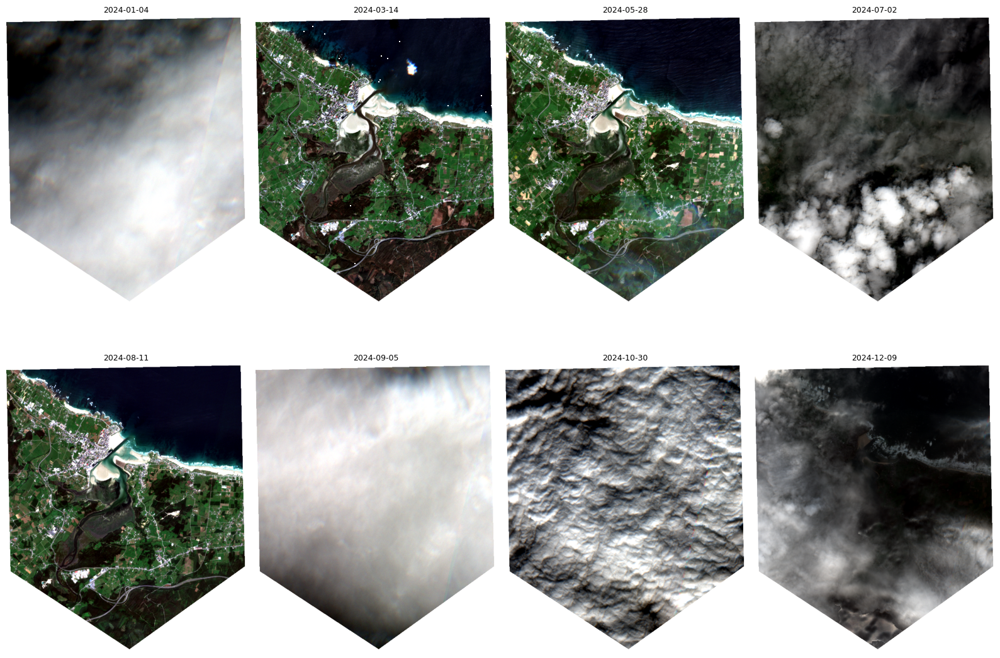

In [69]:
# ── Grid completo de la serie temporal ───────────────────────────────────────
# Muestra todas las fechas descargadas en una cuadrícula para inspeccionarlas
# visualmente. Permite identificar rápidamente:
#   - Escenas nubladas o con sombras
#   - Variaciones estacionales de vegetación e inundación
#   - Posibles errores en la descarga (imagen negra o vacía)
#
# El polígono del AOI se usa como máscara: los píxeles fuera del pentágono
# se pintan en blanco para centrar la atención en el estuario.

# Listar las fechas que realmente tienen un fichero RGB en disco
# (puede ser un subconjunto de selected_dates si alguna descarga falló)
valid_rgb_dates = [
    d for d in selected_dates
    if os.path.exists(os.path.join(dir_rgb, f"rgb_{d}.tif"))
]

print(f"Mostrando {len(valid_rgb_dates)} imágenes")

# Mostrar en cuadrícula 4 columnas con normalización por percentiles (p2-p98)
# para maximizar el contraste visual de cada escena individual
plot_rgb_grid(
    dates=valid_rgb_dates,
    rgb_dir=dir_rgb,
    polygon=polygon,   # Máscara: oculta píxeles fuera del AOI
    title=f"Serie temporal completa — {site} (Sentinel-2 L2A, RGB)",
    cols=4,
)


## 7 · Cálculo del filtro SCL

Para cada escena se calcula qué fracción de sus píxeles cae en una clase "mala" (nubes, sombras, nieve). Las escenas por encima del umbral se descartan.

In [70]:
# ── Filtro de calidad SCL — PASO 3 del pipeline ───────────────────────────────
# Para cada escena, se lee su SCL y se calcula qué fracción de los píxeles
# cae en una clase "mala" (nubes, sombras, etc.).
# Si esa fracción supera scl_bad_fraction → escena DESCARTADA.
#
# Este es el filtro GLOBAL estándar. Su limitación es que no distingue
# entre nubes sobre tierra firme (irrelevantes) y nubes sobre el estuario
# (las que realmente nos importan). El Reference Map (sección 12) mejora esto.

# Paleta de colores oficial de la ESA para visualizar mapas SCL
# Cada clave es el valor entero de la clase; el valor es (descripción, color_hex)
scl_colors = {
    0:  ("No data",             "#000000"),  # Sin datos
    1:  ("Saturado/Defectuoso", "#ff0000"),  # Píxel saturado o defectuoso
    2:  ("Sombra topográfica",  "#2f2f2f"),  # Sombra por terreno (no por nube)
    3:  ("Sombra de nube",      "#646464"),  # Sombra proyectada por una nube ← MALO
    4:  ("Vegetación",          "#00a000"),  # Superficie vegetal ← BUENO
    5:  ("No vegetación",       "#ffe65a"),  # Suelo desnudo, arena, roca ← BUENO
    6:  ("Agua",                "#0000ff"),  # Agua (mar, río, lago) ← BUENO
    7:  ("Sin clasificar",      "#808080"),  # No clasificado
    8:  ("Nube media prob.",    "#c0c0c0"),  # Nube de probabilidad media ← MALO
    9:  ("Nube alta prob.",     "#ffffff"),  # Nube de probabilidad alta ← MALO
    10: ("Cirrus",              "#87ceeb"),  # Nube de cirrus (alta altitud) ← MALO
    11: ("Nieve/Hielo",         "#e0ffff"),  # Nieve o hielo ← MALO en costas
}

# ── Calcular estadísticas SCL por escena ──────────────────────────────────────
scl_stats = {}  # Dict: {fecha: {'bad_fraction': float, 'bad_pct': float, 'class_counts': dict}}

for date in valid_rgb_dates:
    scl_path = os.path.join(dir_scl, f"scl_{date}.tif")

    # Leer el SCL de esta fecha como array 2D uint8
    scl_arr = tif_to_scl(scl_path)
    if scl_arr is None:
        print(f"    {date}: SCL no disponible")
        continue

    # Calcular % de píxeles malos (suma de píxeles en clases scl_bad_classes)
    stats = compute_scl_stats(scl_arr, scl_bad_classes)
    scl_stats[date] = stats

    # Mostrar resultado con veredicto
    verdict = "VÁLIDA" if stats["bad_fraction"] <= scl_bad_fraction else " DESCARTADA"
    print(f"  {date}  {stats['bad_pct']:5.1f}% malos  {verdict}")

# ── Clasificar fechas según el resultado del filtro ───────────────────────────
# Válidas: pasan el umbral → se usan en los análisis siguientes
dates_valid     = [d for d in valid_rgb_dates if d in scl_stats and scl_stats[d]["bad_fraction"] <= scl_bad_fraction]
# Descartadas: superan el umbral → se muestran en la sección 10 para inspección
dates_discarded = [d for d in valid_rgb_dates if d in scl_stats and scl_stats[d]["bad_fraction"] >  scl_bad_fraction]
# Sin SCL: el fichero no existe (descarga fallida o no lanzada)
dates_no_scl    = [d for d in valid_rgb_dates if d not in scl_stats]

print(f"\n── Resultado (umbral SCL = {scl_bad_fraction*100:.0f}%) ──")
print(f"  Válidas:    {len(dates_valid)}")
print(f"  Descartadas:{len(dates_discarded)}")
print(f"  Sin SCL:    {len(dates_no_scl)}")


  2024-01-04  100.0% malos   DESCARTADA
  2024-03-14    0.2% malos  VÁLIDA
  2024-05-28   35.9% malos   DESCARTADA
  2024-07-02   90.5% malos   DESCARTADA
  2024-08-11    0.0% malos  VÁLIDA
  2024-09-05  100.0% malos   DESCARTADA
  2024-10-30  100.0% malos   DESCARTADA
  2024-12-09   80.6% malos   DESCARTADA

── Resultado (umbral SCL = 20%) ──
  Válidas:    2
  Descartadas:6
  Sin SCL:    0


## 9 · Grid de imágenes válidas

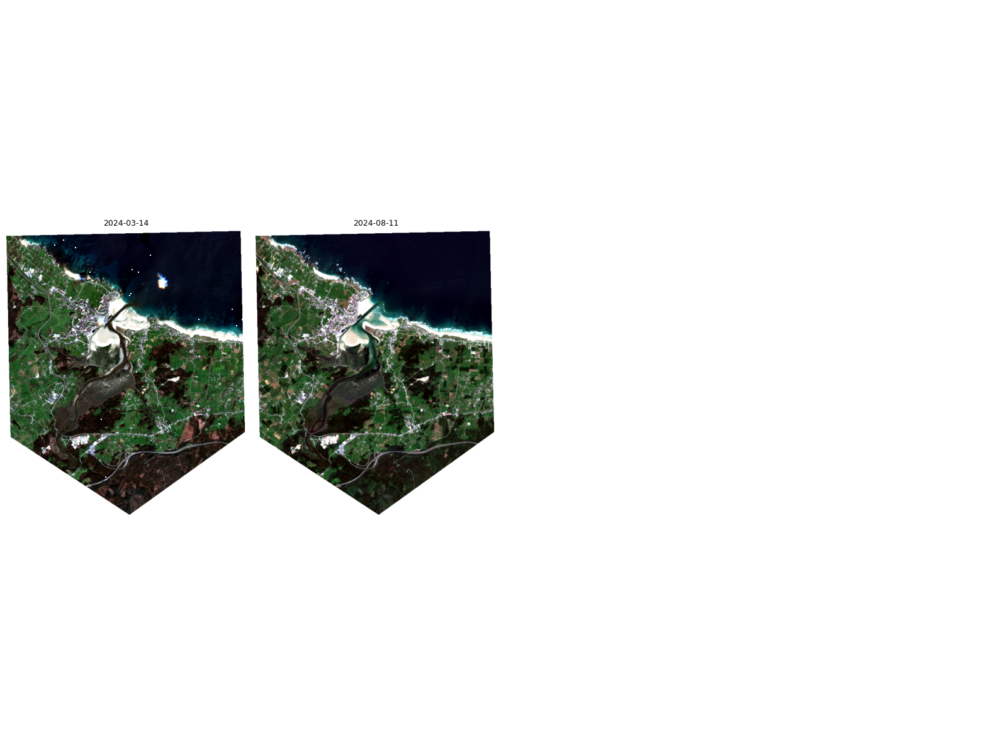

In [71]:
# ── Grid solo con fechas válidas según SCL ─────────────────────────────────
plot_rgb_grid(
        dates=dates_valid,
        rgb_dir=dir_rgb,
        polygon=polygon,
        title=f"Escenas VÁLIDAS (≤{scl_bad_fraction*100:.0f}% píxeles malos) — {site}",
        cols=4,)

## 10 · Grid de imágenes descartadas

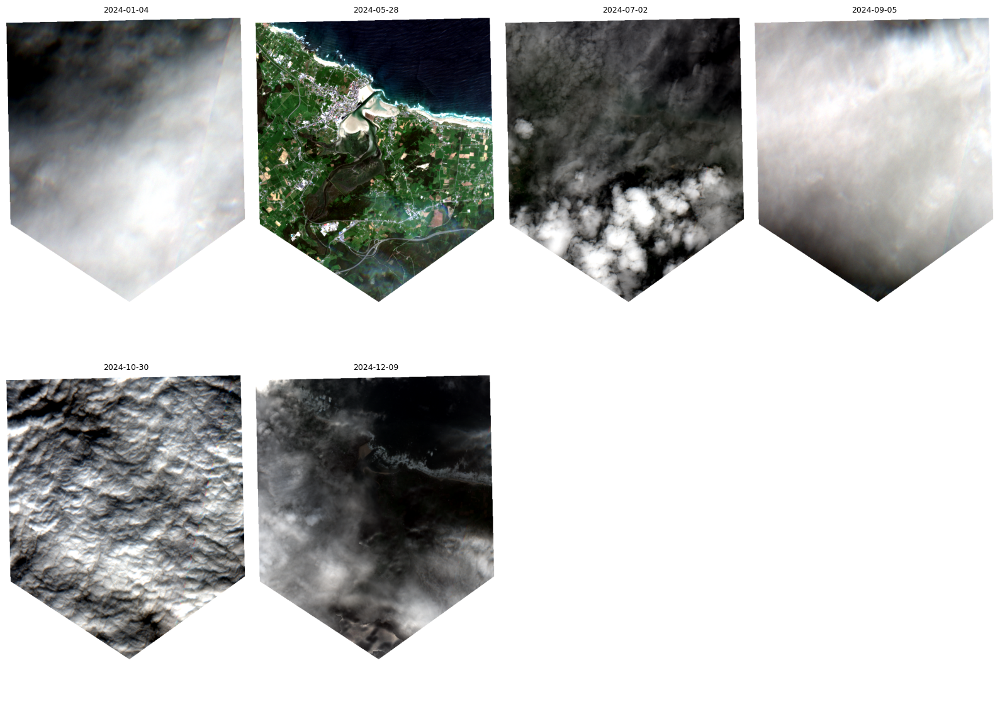

In [72]:
# ── Grid solo con fechas descartadas según SCL ───────────────────────────────
if dates_discarded:
    subtitles_discarded = {
        d: f"{scl_stats[d]['bad_pct']:.1f}% malos"
        for d in dates_discarded if d in scl_stats
    }
    highlights_discarded = {d: "#e74c3c" for d in dates_discarded}

    plot_rgb_grid(
        dates=dates_discarded,
        rgb_dir=dir_rgb,
        polygon=polygon,
        title=f"Escenas DESCARTADAS (>{scl_bad_fraction*100:.0f}% píxeles malos) — {site}",
        cols=4,
    )
else:
    print("Todas las escenas pasaron el filtro SCL. 🎉")

## 11 · (Opcional) Visualizar el mapa SCL de una escena

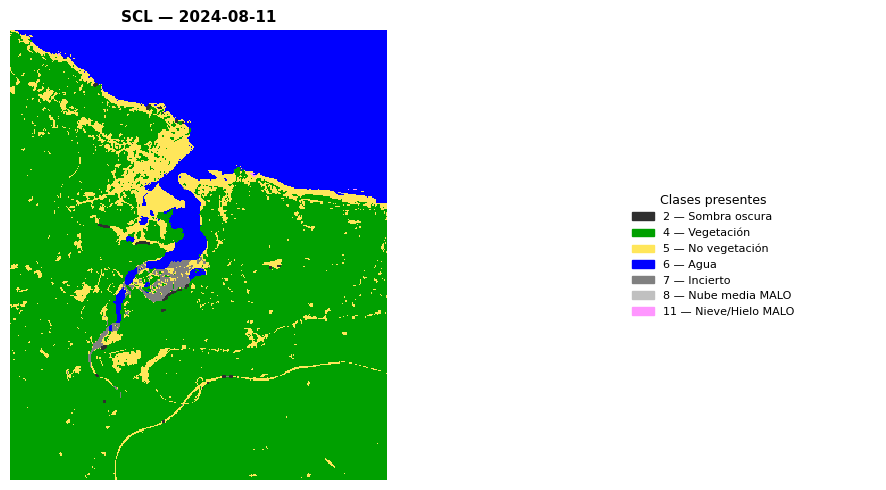

In [73]:
# ── Inspección visual de una escena SCL ──────────────────────────────────────
# Muestra el mapa SCL de una fecha concreta con los colores oficiales de la ESA.
# Útil para entender visualmente por qué una escena fue descartada o aceptada.
#
# Cambia el índice de selected_dates[] para inspeccionar otra fecha.
# Por ejemplo: [0] = primera fecha, [-1] = última fecha.

inspect_date = selected_dates[4]   # ← modifica este índice para cambiar la fecha

plot_scl_map(
    inspect_date,
    dir_scl,
    scl_colors=scl_colors,           # Paleta de colores ESA definida arriba
    scl_bad_classes=scl_bad_classes, # Clases a destacar como "malas"
    scl_stats=scl_stats,             # Estadísticas pre-calculadas para mostrar el %
    scl_max_bad_fraction=scl_bad_fraction,  # Umbral para mostrar VÁLIDA/DESCARTADA
)


In [74]:
# ── Selección de fechas para el Reference Map local ──────────────────────────
# Para construir el reference map se necesitan escenas MUY limpias (< 5% de nubes).
# Se usa un umbral más estricto que el filtro general (5% vs 20%) porque el
# reference map es la "base de verdad" del análisis: errores aquí se propagan.
#
# NOTA: Este bloque usa el conjunto de muestra (selected_dates).
#       La construcción robusta vía OpenEO (año completo, sección 12)
#       es el enfoque recomendado para el análisis final.

reference_dates = [
    d
    for d, stats in scl_stats.items()
    if stats["bad_fraction"] <= 0.05  # Solo escenas con ≤5% de píxeles malos
]

print(f"Fechas seleccionadas para reference map: {len(reference_dates)}")
print(reference_dates)

# Cargar los SCLs de esas fechas y apilarlos en un array 3D (T, H, W)
# donde T = número de fechas, H = filas, W = columnas del raster
scl_stack = load_scl_stack(
    reference_dates,
    dir_scl,
)
print(f"\nShape del stack: {scl_stack.shape}  (fechas, filas, columnas)")


Fechas seleccionadas para reference map: 2
['2024-03-14', '2024-08-11']

Shape del stack: (2, 792, 663)  (fechas, filas, columnas)


Píxeles en zona de transición: 40,153 (7.65% del AOI)


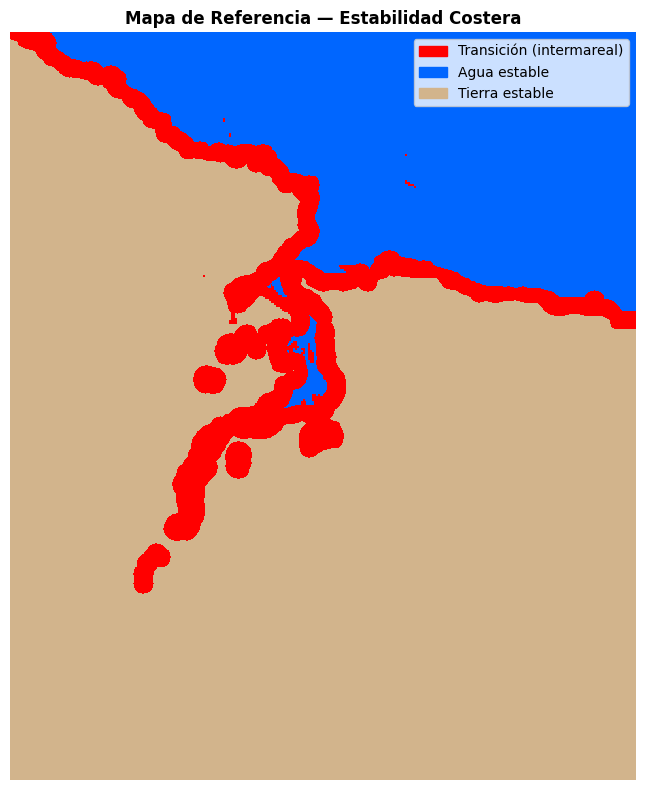

In [75]:
# ── Construcción del Reference Map local (PASO 4 simplificado) ───────────────
# A partir del stack de SCLs limpios, se construye el mapa de estabilidad
# que clasifica cada píxel como:
#
#   0 → TRANSICIÓN (zona intermareal candidata)
#       El píxel no es estables: aparece como agua en algunas fechas y
#       como tierra en otras, O está en el buffer costero adyacente a la
#       zona de cambio.
#
#   1 → AGUA ESTABLE
#       El píxel NUNCA apareció como tierra en ninguna observación clara.
#       Está permanentemente bajo el agua (canal principal, mar abierto).
#
#   2 → TIERRA ESTABLE
#       El píxel NUNCA apareció como agua en ninguna observación clara.
#       Está permanentemente fuera del alcance de la marea.
#
# Parámetros clave:
#   stable_threshold=0.95      → necesita ≥95% de observaciones como agua/tierra
#                                 para clasificarse como estable
#   coastal_buffer_pixels=10   → añade 10 píxeles (= 200m a 20m/px) de buffer
#                                 alrededor del límite agua/tierra, capturando
#                                 píxeles fronterizos que podrían perderse

reference_map, P_water, P_land = build_reference_map(
    scl_stack,
    stable_threshold=0.95,
    coastal_buffer_pixels=10,
)

# La máscara de transición es simplemente los píxeles con valor 0 en el reference map
transition_mask = (reference_map == 0)  # True = zona intermareal

print(
    f"Píxeles en zona de transición: "
    f"{transition_mask.sum():,} "
    f"({100 * transition_mask.mean():.2f}% del AOI)"
)

# Visualizar el mapa con tres colores: rojo=transición, azul=agua, arena=tierra
plot_reference_map(reference_map)


In [76]:
# ── Diagnóstico: comparar filtro global vs filtro en transición ───────────────
# Esta celda ilustra la diferencia entre los dos enfoques de filtrado:
#
#   FILTRO GLOBAL (PASO 3):
#     % nubes en todo el AOI > umbral → descarta la escena entera
#
#   FILTRO EN TRANSICIÓN (PASO 5):
#     % nubes dentro de la zona intermareal > umbral → descarta la escena
#     Una escena puede tener muchas nubes sobre tierra firme o mar abierto,
#     pero estar perfectamente despejada sobre el estuario → SE ACEPTA

# Ver las dimensiones del stack para confirmar que se cargó correctamente
print(f"Shape del SCL stack: {scl_stack.shape}  → ({scl_stack.shape[0]} fechas, {scl_stack.shape[1]}×{scl_stack.shape[2]} px)")

# ── Seleccionar una escena de prueba ──────────────────────────────────────────
test_date = "2024-07-02"

scl_path = os.path.join(dir_scl, f"scl_{test_date}.tif")
scl_original = tif_to_scl(scl_path)  # Array 2D uint8 con las clases SCL

# ── Calcular fracción de malos según el filtro GLOBAL ────────────────────────
bad_mask_original = np.isin(scl_original, scl_bad_classes)  # True donde hay nubes
bad_fraction_original = bad_mask_original.sum() / bad_mask_original.size
print(f"\nFiltro global  → {100*bad_fraction_original:.2f}% píxeles malos")

# ── Calcular fracción de malos según el filtro en TRANSICIÓN ─────────────────
transition_mask = (reference_map == 0)  # Solo los píxeles intermareales

# compute_transition_cloud_stats cuenta solo los píxeles malos que están
# DENTRO de la zona de transición, ignorando el resto del AOI
stats_transition = compute_transition_cloud_stats(
    scl_original,
    transition_mask,   # Máscara booleana 2D: True = zona intermareal
    scl_bad_classes,
)
print(f"Filtro transición → {stats_transition['bad_pct']:.2f}% nubes en zona intermareal")
print(f"\nConclusión: el filtro en transición puede aceptar escenas que el filtro")
print(f"global descartaría si las nubes están fuera del estuario.")


Shape del SCL stack: (2, 792, 663)  → (2 fechas, 792×663 px)

Filtro global  → 90.45% píxeles malos
Filtro transición → 98.17% nubes en zona intermareal

Conclusión: el filtro en transición puede aceptar escenas que el filtro
global descartaría si las nubes están fuera del estuario.


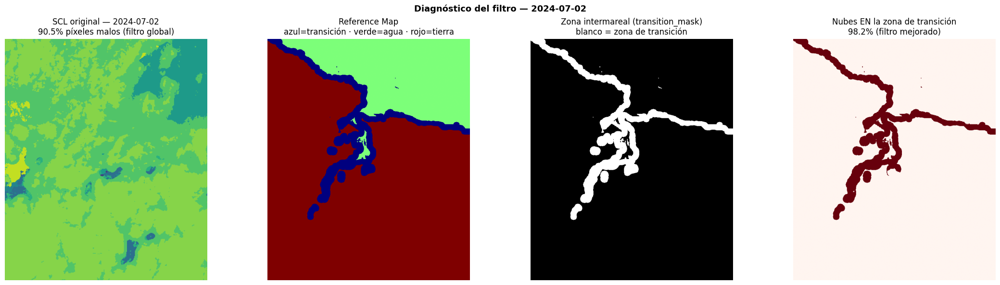

In [77]:
# ── Visualización diagnóstica: 4 paneles comparativos ────────────────────────
# Muestra en una sola figura los 4 elementos clave para entender el filtrado:
#
#   Panel 1 — SCL original:    los valores brutos del clasificador
#   Panel 2 — Reference map:   las zonas de agua/tierra/transición estables
#   Panel 3 — Zona intermareal: la máscara donde se evalúan las nubes
#   Panel 4 — Nubes en transición: solo las nubes que realmente importan

fig, axes = plt.subplots(1, 4, figsize=(22, 6))

# ── Panel 1: SCL original ─────────────────────────────────────────────────────
# Muestra el mapa SCL completo de la escena de prueba.
# Los colores van de negro (clase 0) a blanco (clase 9, nubes altas).
axes[0].imshow(scl_original, vmin=0, vmax=11)
axes[0].set_title(
    f"SCL original — {test_date}\n"
    f"{100*bad_fraction_original:.1f}% píxeles malos (filtro global)"
)
axes[0].axis("off")

# ── Panel 2: Reference Map ────────────────────────────────────────────────────
# Muestra el resultado del PASO 4: zonas estables y zona de transición.
# jet colormap: azul=0 (transición), verde=1 (agua), rojo=2 (tierra)
axes[1].imshow(reference_map, cmap="jet")
axes[1].set_title(
    "Reference Map\n"
    "azul=transición · verde=agua · rojo=tierra"
)
axes[1].axis("off")

# ── Panel 3: Zona intermareal ─────────────────────────────────────────────────
# La transition_mask en blanco/negro: blanco = zona de transición (value=True)
# Esta es la zona donde se evalúa la nubosidad en el filtro mejorado.
axes[2].imshow(transition_mask, cmap="gray")
axes[2].set_title(
    "Zona intermareal (transition_mask)\n"
    "blanco = zona de transición"
)
axes[2].axis("off")

# ── Panel 4: Nubes dentro de la zona de transición ────────────────────────────
# Intersección de (píxeles malos) AND (zona de transición).
# Estos son los únicos píxeles que importan para el filtrado mejorado.
clouds_transition = (
    np.isin(scl_original, scl_bad_classes)  # Píxeles malos en toda la escena
    & transition_mask                         # Solo los que están en la transición
)
axes[3].imshow(clouds_transition, cmap="Reds")
axes[3].set_title(
    f"Nubes EN la zona de transición\n"
    f"{stats_transition['bad_pct']:.1f}% (filtro mejorado)"
)
axes[3].axis("off")

plt.suptitle(
    f"Diagnóstico del filtro — {test_date}",
    fontsize=13, fontweight="bold"
)
plt.tight_layout()
plt.show()


## 12 · Reference Map — construcción autónoma via OpenEO

A partir de aquí el análisis es independiente de las `selected_dates` del ejercicio anterior.

**Estrategia:**
1. Consultamos **todas las fechas disponibles** en el rango temporal completo.
2. Descargamos el **datacube SCL completo** (todas esas fechas, un solo batch job).
3. Calculamos `bad_fraction` para cada fecha directamente del datacube.
4. Seleccionamos las `reference_dates` con `bad_fraction ≤ umbral_referencia`.
5. Construimos el **reference map** en el backend (UDF + `reduce_dimension`) y lo descargamos como un **único GeoTIFF 2D** — en lugar de N SCLs individuales.


In [20]:
# ════════════════════════════════════════════════════════════════════════════
# CONFIGURACIÓN DEL REFERENCE MAP — año de referencia
# ════════════════════════════════════════════════════════════════════════════
#
# A partir de aquí el análisis es INDEPENDIENTE de selected_dates.
# Se usa un año completo (ref_time_extent) para construir el reference map
# con el máximo número de observaciones posibles → resultado más robusto.
#
# El año de referencia puede ser diferente al año de análisis (time_extent).
# Ideal: el mismo año o el año anterior al análisis.

# Año completo para construir el Reference Map
# (se descargará el cubo SCL completo en un solo batch job)
ref_time_extent = [
    "2011-01-01",
    None,
]

# Solo usar escenas con ≤5% de píxeles malos para el reference map
# (umbral más estricto que el filtro general del 20%)
ref_bad_fraction_threshold = 0.05

# Clases SCL consideradas malas en el reference map
# (se excluye la clase 11=nieve porque es rara en la costa gallega)
ref_bad_classes = [3, 8, 9, 10]

# Umbral de estabilidad: qué fracción de observaciones claras deben
# ser agua/tierra para clasificar el píxel como "estable"
# 0.95 → al menos 95% de las observaciones claras deben coincidir
ref_stable_threshold = 0.95

# Buffer espacial alrededor del límite agua/tierra (en píxeles a 20m/px)
# 10 píxeles = 200 metros de franja extra de transición
ref_coastal_buffer_pixels = 10

# Umbral para el filtro de nubes en la zona de transición (PASO 5)
# Una escena se acepta si tiene ≤20% de nubes dentro del estuario
# IMPORTANTE: Debe ser > ref_bad_fraction_threshold para recuperar fechas adicionales
transition_cloud_threshold = 0.1

# Ruta de salida para el GeoTIFF del reference map
ref_map_path = "reference_map_openeo.tif"

# Mostrar resumen de la configuración
print(f"Rango temporal reference map: {ref_time_extent[0]} → {ref_time_extent[1]}")
print(f"Umbral escenas limpias (reference): ≤{ref_bad_fraction_threshold*100:.0f}% píxeles malos")
print(f"Umbral estabilidad píxel:           ≥{ref_stable_threshold*100:.0f}% observaciones coincidentes")
print(f"Buffer costero:                      {ref_coastal_buffer_pixels} px ({ref_coastal_buffer_pixels*20} m)")
print(f"Umbral nubes en transición (PASO 5): ≤{transition_cloud_threshold*100:.0f}%")

Rango temporal reference map: 2011-01-01 → None
Umbral escenas limpias (reference): ≤5% píxeles malos
Umbral estabilidad píxel:           ≥95% observaciones coincidentes
Buffer costero:                      10 px (200 m)
Umbral nubes en transición (PASO 5): ≤10%


In [21]:
# ── Ejecutar el batch job del Reference Map en el backend ─────────────────────
# Esta celda lanza el job más costoso del pipeline: descarga todo el año de
# SCL (≈100 escenas) y ejecuta el UDF de votación directamente en el servidor.
#
# Tiempo estimado: 5-15 minutos dependiendo de la carga del backend.
#
# El resultado es un GeoTIFF de ~pocos MB con el reference map 2D.
# Si ref_map_path ya existe en disco, se puede cambiar force=False para saltarlo.
#
# Parámetros pasados al UDF:
#   - bad_fraction_threshold : escenas con >5% de nubes se ignoran en el voto
#   - stable_threshold       : umbral P_water para clasificar como estable
#   - transition_buffer_pixels: buffer espacial alrededor del límite agua/tierra

status_ref = download_reference_map_openeo(
    conn=conn,
    bbox=bbox,
    time_extent=ref_time_extent,
    out_path=ref_map_path,
    bad_classes=ref_bad_classes,
    bad_fraction_threshold=ref_bad_fraction_threshold,
    stable_threshold=ref_stable_threshold,
    transition_buffer_pixels=ref_coastal_buffer_pixels,
    force=False,  # ← cambiar a False si el fichero ya existe y no quieres recalcular
)

print(f"Estado del job: {status_ref}")


    Reference map ya existe en reference_map_openeo.tif, saltando.
Estado del job: skipped


Dimensiones: (792, 663)  (13260×15840 m a 20m/px)
CRS:         EPSG:32629

  0  Transición   ← zona intermareal candidata        62,639 px (11.9%)
  1  Agua estable ← nunca al descubierto             111,303 px (21.2%)
  2  Tierra estable ← nunca inundada                 351,154 px (66.9%)

→ La zona de transición tiene 62,639 píxeles
  (25.06 km² a 20m/px)


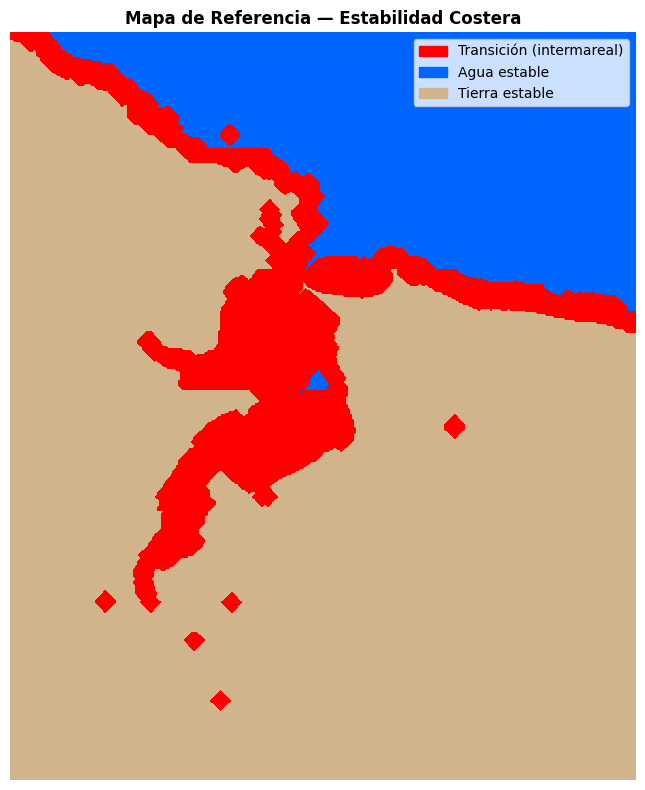

In [22]:
# ── Cargar el Reference Map descargado y visualizarlo ─────────────────────────
# Lee el GeoTIFF del reference map desde disco y extrae:
#   - reference_map_openeo : array 2D uint8 con valores 0/1/2
#   - ref_transform        : transformada afín (mapea píxeles a coordenadas)
#   - ref_crs              : sistema de referencia (normalmente UTM zona 29N)

reference_map_openeo, ref_transform, ref_crs = load_reference_map_tif(ref_map_path)

# La transition_mask es simplemente todos los píxeles con valor 0
# (aquellos que NO son ni agua estable ni tierra estable)
transition_mask = (reference_map_openeo == 0)

# ── Estadísticas del reference map ────────────────────────────────────────────
print(f"Dimensiones: {reference_map_openeo.shape}  ({reference_map_openeo.shape[1]*20}×{reference_map_openeo.shape[0]*20} m a 20m/px)")
print(f"CRS:         {ref_crs}")
print()

# Contar y mostrar la distribución de píxeles por clase
for val, label in [
    (0, "Transición   ← zona intermareal candidata"),
    (1, "Agua estable ← nunca al descubierto"),
    (2, "Tierra estable ← nunca inundada"),
]:
    n = (reference_map_openeo == val).sum()
    pct = 100 * n / reference_map_openeo.size
    print(f"  {val}  {label:<45}  {n:>8,} px ({pct:.1f}%)")

print(f"\n→ La zona de transición tiene {transition_mask.sum():,} píxeles")
print(f"  ({transition_mask.sum() * 400 / 1e6:.2f} km² a 20m/px)")

# Visualizar con colores: rojo=transición, azul=agua, arena=tierra
plot_reference_map(reference_map_openeo)

## 13 · Corrección SCL con Reference Map

Aplicamos el reference map a las fechas del rango completo que tengan `bad_fraction > umbral`.  
Los píxeles clasificados como sombra/nube sobre zonas estables conocidas se reasignan a agua (6) o tierra (5), reduciendo la fracción de malos.


### Re-autenticación OpenEO (en caso de error de conexión)

Si obtienes un error de conexión (`ConnectionResetError`, `ProtocolError`), ejecuta esta celda para re-autenticarte antes de reintentar.

In [23]:
# ── Re-autenticación OpenEO (solo si hay errores de conexión) ────────────────
# Ejecutar esta celda si la siguiente falla con ConnectionResetError

try:
    # Verificar si ya está conectado
    account = conn.describe_account()
    print(f"Ya conectado como: {account['name']}")
except:
    # Re-autenticar si falló
    print("🔄 Re-autenticando...")
    conn.authenticate_oidc()
    print(f"Re-autenticado como: {conn.describe_account()['name']}")

Ya conectado como: Jorge Alias


In [24]:
# ── Evaluación de nubosidad en zona de transición — PASO 5 ───────────────────
# Descarga el cubo SCL del año completo (ref_time_extent) como NetCDF y clasifica
# CADA fecha disponible en una de estas dos categorías:
#
#   FECHA DE REFERENCIA (automáticamente válida):
#     Si la fracción GLOBAL de píxeles malos ≤ ref_bad_fraction_threshold (5%)
#     → Esta fecha fue usada para construir el reference map. Se incluye en el
#       resultado con su fracción global real (que es ≤ 5%, siempre válida).
#
#   FECHA EVALUADA (filtro de transición):
#     Si la fracción global > 5% → Tiene nubes, pero pueden estar fuera del estuario.
#     → Se calcula el % de píxeles malos SOLO dentro de la zona de transición.
#     → Si ese % ≤ transition_cloud_threshold (20%) → fecha válida.
#
# Esta distinción es importante: las fechas de referencia son las mismas que
# el UDF usó internamente para votar agua/tierra en el reference map, y son
# válidas por definición para el water frequency.

transition_stats_raw = evaluate_transition_cloud_coverage_openeo(
    conn=conn,
    bbox=bbox,
    time_extent=ref_time_extent,
    reference_map=reference_map_openeo,
    reference_transform=ref_transform,
    bad_classes=ref_bad_classes,
    reference_dates=[],
    global_bad_fraction_threshold=ref_bad_fraction_threshold,
)

# Convertir al formato estándar del pipeline: {fecha: {"bad_fraction": float, "bad_pct": float}}
transition_stats = {
    date: {
        "bad_fraction": pct / 100,
        "bad_pct":      pct,
    }
    for date, pct in transition_stats_raw.items()
}

# Contar cuántas fechas fueron identificadas como "de referencia" (≤5% global)
n_ref_quality = sum(1 for s in transition_stats.values() if s["bad_fraction"] <= ref_bad_fraction_threshold)
n_transition_only = sum(1 for s in transition_stats.values() if s["bad_fraction"] > ref_bad_fraction_threshold and s["bad_fraction"] <= transition_cloud_threshold)
n_discarded = sum(1 for s in transition_stats.values() if s["bad_fraction"] > transition_cloud_threshold)

print(f"Fechas evaluadas en {ref_time_extent[0]} → {ref_time_extent[1]}: {len(transition_stats)}")
print()
print(f"  Calidad de referencia (≤{ref_bad_fraction_threshold*100:.0f}% global): {n_ref_quality:3d} ← usadas para construir el reference map")
print(f"  Válidas solo en transición:                    {n_transition_only:3d} ← estuario despejado pese a nubes en el AOI")
print(f"  Descartadas (>{transition_cloud_threshold*100:.0f}% en transición):        {n_discarded:3d}")
print()
for date, s in sorted(transition_stats.items()):
    if s["bad_fraction"] <= ref_bad_fraction_threshold:
        tag = "[ref]"
    elif s["bad_fraction"] <= transition_cloud_threshold:
        tag = "[✓]  "
    else:
        tag = "[✗]  "
    print(f"  {tag} {date}: {s['bad_pct']:.1f}%")

  Consultando fechas (2011-01-01 -> None)...
  Ejemplo fechas parseadas: ['2015-07-08', '2015-07-15', '2015-07-25']
  Fechas totales: 1495 | Referencia: 0 | A evaluar: 1495
  Lanzando batch job (descarga del cubo SCL completo)...
0:00:00 Job 'j-2607220759474088a2e1f6faa41b356c': send 'start'
0:00:02 Job 'j-2607220759474088a2e1f6faa41b356c': queued (progress 0%)
0:00:07 Job 'j-2607220759474088a2e1f6faa41b356c': queued (progress 0%)
0:00:14 Job 'j-2607220759474088a2e1f6faa41b356c': queued (progress 0%)
0:00:22 Job 'j-2607220759474088a2e1f6faa41b356c': queued (progress 0%)
0:00:32 Job 'j-2607220759474088a2e1f6faa41b356c': queued (progress 0%)
0:00:44 Job 'j-2607220759474088a2e1f6faa41b356c': queued (progress 0%)
0:01:00 Job 'j-2607220759474088a2e1f6faa41b356c': queued (progress 0%)
0:01:19 Job 'j-2607220759474088a2e1f6faa41b356c': running (progress N/A)
0:01:43 Job 'j-2607220759474088a2e1f6faa41b356c': running (progress N/A)
0:02:13 Job 'j-2607220759474088a2e1f6faa41b356c': running (progr

UnboundLocalError: cannot access local variable 'os' where it is not associated with a value

In [ ]:
# ── Clasificar fechas según el filtro de transición ──────────────────────────
# Aplicar el umbral transition_cloud_threshold para dividir las fechas
# evaluadas en válidas y descartadas.
#
# transition_stats viene de la celda anterior (evaluate_transition_cloud_coverage_openeo)
# Contiene TODAS las fechas del año completo (ref_time_extent), no solo las 8 de muestra.
# Formato: {fecha: {"bad_fraction": float, "bad_pct": float}}

# Fechas que pasan el filtro de transición
valid_dates_transition = [
    d
    for d, s in transition_stats.items()
    if s["bad_fraction"] <= transition_cloud_threshold
]

# Fechas que no pasan el filtro (demasiadas nubes sobre el estuario)
discarded_dates_transition = [
    d
    for d, s in transition_stats.items()
    if s["bad_fraction"] > transition_cloud_threshold
]

print(f"Umbral aplicado: ≤{transition_cloud_threshold*100:.0f}% nubes en zona de transición")
print()
print(f"Fechas válidas del año completo:  {len(valid_dates_transition):3d}")
print(f"Fechas descartadas:               {len(discarded_dates_transition):3d}")
print(f"─────────────────────────────────────────────")
print(f"TOTAL fechas para water frequency: {len(valid_dates_transition):3d}")


Umbral aplicado: ≤10% nubes en zona de transición

Fechas válidas del año completo:    0
Fechas descartadas:                 0
─────────────────────────────────────────────
TOTAL fechas para water frequency:   0


In [ ]:
# ── Fechas recuperadas gracias al filtro de transición ───────────────────────
# Compara cuántas fechas del año de referencia (2023) pasan el filtro de
# transición frente a cuántas hubieran pasado el filtro global estricto
# del reference map (≤5% global).
#
# IMPORTANTE: transition_stats contiene DOS tipos de valores mezclados:
#   - Para fechas ≤5% global: la fracción GLOBAL (ej: 3.2%)
#   - Para fechas >5% global: la fracción EN TRANSICIÓN (ej: 12.5%)
#
# Por eso separamos así:
#   - REFERENCIA: transition_stats ≤5% → son las que tienen ≤5% GLOBAL
#   - RECUPERADAS: transition_stats >5% pero ≤20% → tienen >5% global pero transición despejada

# Fechas de referencia: las que tienen ≤5% en transition_stats son las que
# tienen ≤5% GLOBAL (la función devuelve fracción global para estas)
reference_dates = sorted([
    d for d, s in transition_stats.items()
    if s["bad_fraction"] <= ref_bad_fraction_threshold
])

# Fechas recuperadas: las que tienen >5% en transition_stats (o sea, >5% global)
# pero ≤20% en transición (el valor que devuelve transition_stats para ellas)
newly_valid = sorted([
    d for d, s in transition_stats.items()
    if s["bad_fraction"] > ref_bad_fraction_threshold 
    and s["bad_fraction"] <= transition_cloud_threshold
])

print(f"Fechas del año {ref_time_extent[0][:4]} que pasan el filtro de transición: {len(valid_dates_transition)}")
print(f"  → Calidad de referencia (≤{ref_bad_fraction_threshold*100:.0f}% global):        {len(reference_dates):3d} fechas")
print(f"  → Recuperadas por filtro de transición:          {len(newly_valid):3d} fechas")
print(f"     (>{ref_bad_fraction_threshold*100:.0f}% global pero ≤{transition_cloud_threshold*100:.0f}% en transición)")
print()

if newly_valid:
    print(f"Primeras 10 fechas recuperadas por el filtro de transición:")
    for d in newly_valid[:10]:
        trans_pct = transition_stats[d]["bad_pct"]
        print(f"  {d}  [nubes en transición: {trans_pct:.1f}%]  (>5% global)")
    if len(newly_valid) > 10:
        print(f"  ... y {len(newly_valid) - 10} fechas más")
    print()
    print(f"✓ El filtro de transición recuperó {len(newly_valid)} fechas adicionales")
    print(f"  ({len(newly_valid)/len(valid_dates_transition)*100:.1f}% del total de fechas válidas)")
else:
    print("⚠️  No se recuperaron fechas adicionales.")
    print("   Esto significa que NO hay fechas con nubes fuera del estuario")
    print("   pero estuario despejado en este año.")
    if transition_cloud_threshold == ref_bad_fraction_threshold:
        print(f"\n   NOTA: transition_cloud_threshold ({transition_cloud_threshold*100:.0f}%) = ref_bad_fraction_threshold ({ref_bad_fraction_threshold*100:.0f}%)")
        print("   Considera aumentar transition_cloud_threshold a 0.20 para recuperar más fechas.")


Fechas del año 2011 que pasan el filtro de transición: 0
  → Calidad de referencia (≤5% global):          0 fechas
  → Recuperadas por filtro de transición:            0 fechas
     (>5% global pero ≤10% en transición)

⚠️  No se recuperaron fechas adicionales.
   Esto significa que NO hay fechas con nubes fuera del estuario
   pero estuario despejado en este año.


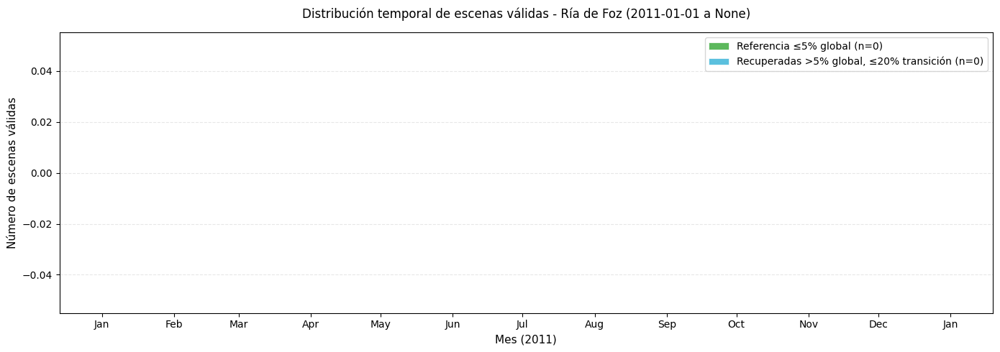


── Cobertura mensual de escenas válidas ──


In [ ]:
# ── Histograma temporal: distribución de fechas válidas a lo largo del año ──
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from datetime import datetime

# Convertir fechas a objetos datetime para el histograma
dates_ref = [datetime.strptime(d, "%Y-%m-%d") for d in reference_dates]
dates_new = [datetime.strptime(d, "%Y-%m-%d") for d in newly_valid]

# Año real del análisis (derivado de ref_time_extent, NO hardcodeado)
hist_year = int(ref_time_extent[0][:4])

# Crear figura
fig, ax = plt.subplots(figsize=(14, 5))

# Configurar bins mensuales para todo el año de análisis
# Crear bins manualmente: primer día de cada mes + 1 de enero del año siguiente
bins_dates = [datetime(hist_year, m, 1) for m in range(1, 13)] + [datetime(hist_year + 1, 1, 1)]

# Histograma apilado (solo fechas válidas)
ax.hist(
    [dates_ref, dates_new],
    bins=bins_dates,
    label=[
        f'Referencia ≤5% global (n={len(dates_ref)})',
        f'Recuperadas >5% global, ≤20% transición (n={len(dates_new)})'
    ],
    color=['#5cb85c', '#5bc0de'],
    stacked=True,
    edgecolor='white',
    linewidth=0.5
)

# Formateo del eje X
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
ax.set_xlabel(f'Mes ({hist_year})', fontsize=11)
ax.set_ylabel('Número de escenas válidas', fontsize=11)
ax.set_title(
    f'Distribución temporal de escenas válidas - Ría de Foz ({ref_time_extent[0]} a {ref_time_extent[1]})',
    fontsize=12,
    pad=15
)
ax.legend(loc='upper right', fontsize=10)
ax.grid(axis='y', alpha=0.3, linestyle='--')

plt.tight_layout()
plt.show()

# Resumen estadístico por mes
print("\n── Cobertura mensual de escenas válidas ──")
valid_dates_dt = dates_ref + dates_new
months_count = {}
for dt in valid_dates_dt:
    month = dt.strftime("%Y-%m")
    months_count[month] = months_count.get(month, 0) + 1

for month in sorted(months_count.keys()):
    count = months_count[month]
    month_name = datetime.strptime(month, "%Y-%m").strftime("%B %Y")
    bar = "█" * count
    print(f"  {month_name:15s}  {count:2d} escenas  {bar}")


In [ ]:
# ── Cuantificar la mejora del filtro de transición sobre el filtro global ─────
# Compara cuántas fechas del AÑO COMPLETO (2023) pasan cada filtro:
#
#   Filtro global estricto (≤5%): fechas usadas para construir el reference map
#   Filtro de transición  (≤20%): fechas con estuario despejado aunque el AOI esté nublado
#
# Ambos valores salen de transition_stats, que ya los tiene separados por el
# parámetro global_bad_fraction_threshold que pasamos a evaluate_transition_cloud_coverage_openeo.

# Fechas con calidad de referencia: ≤5% píxeles malos en todo el AOI
n_ref_quality = sum(
    1 for s in transition_stats.values()
    if s["bad_fraction"] <= ref_bad_fraction_threshold
)

# Fechas recuperadas: >5% global pero ≤20% en la zona de transición
n_recovered_transition = sum(
    1 for s in transition_stats.values()
    if ref_bad_fraction_threshold < s["bad_fraction"] <= transition_cloud_threshold
)

n_total = len(transition_stats)

gain = quantify_reference_gain(
    n_initial_valid=n_ref_quality,         # Fechas que pasarían solo el filtro global (≤5%)
    n_recovered=n_recovered_transition,    # Fechas adicionales gracias al filtro de transición
    n_total_dates=n_total,                 # Total de fechas del año (2023)
)



══ Ganancia del filtro de transición ══
Fechas iniciales (filtro global): 0
Fechas recuperadas:              0
Fechas finales válidas:          0
Cobertura inicial:               0.0%
Cobertura final:                 0.0%
Ganancia relativa:               0.0%


## 14 · Water Frequency Raster

Para cada píxel del AOI se calcula la fracción de observaciones (solo escenas válidas) en que el SCL registró agua (clase 6), usando únicamente observaciones claras (SCL ∈ {4, 5, 6}):

$$\text{water\_frequency}(x, y) = \frac{\sum_t \mathbf{1}[\text{SCL}_t = 6]}{\sum_t \mathbf{1}[\text{SCL}_t \in \{4, 5, 6\}]}$$

- **≈ 0** → siempre tierra (por encima de la línea de pleamar)
- **≈ 1** → siempre agua (por debajo de la línea de bajamar)
- **0.10 – 0.95** → zona intertidal (intermitentemente inundada)

In [ ]:
# ── Cálculo del Water Frequency Raster — PASO 6 ──────────────────────────────
# Usamos SOLO las fechas válidas (escenas limpias tras el filtro de transición),
# no todas las del año. Incluir escenas nubladas mete ruido: nubes/sombras
# mal clasificadas como agua y píxeles con muy pocas observaciones claras.

# Fechas válidas: referencia (≤5% global) + recuperadas por transición
valid_dates_for_wf = sorted(valid_dates_transition)

print(f"Fechas válidas para water frequency: {len(valid_dates_for_wf)}")
print(f"  (de {len(transition_stats)} disponibles en el año)")
if valid_dates_for_wf:
    print(f"  Rango: {valid_dates_for_wf[0]} → {valid_dates_for_wf[-1]}")
else:
    print(f"  ⚠️ PROBLEMA: No hay fechas válidas disponibles")
    print(f"     Causas posibles:")
    print(f"       - transition_stats está vacío (no se obtuvieron fechas)")
    print(f"       - Todas las fechas fueron filtradas por exceso de nubes")
    print(f"       - Los archivos SCL no se descargaron correctamente")
    print(f"     Solución: revisa las celdas anteriores y los archivos en 'tifs_scl/'")
print()

# Verificar que hay fechas antes de continuar
if not valid_dates_for_wf:
    raise ValueError(
        "❌ No se puede calcular water frequency sin fechas válidas.\n"
        "   Ejecuta primero la celda anterior (evaluate_transition_cloud_coverage_openeo)\n"
        "   para obtener estadísticas de calidad de las escenas."
    )

wf_out_path = "water_frequency.tif"

# 1) Descarga SCL, restringe a valid_dates y aplica min_obs (anti-ruido)
# 2) Calcula water_frequency píxel a píxel (NaN donde hay pocas observaciones)
# 3) Guarda el resultado como GeoTIFF
# ► force=True para recalcular con los nuevos filtros (borra el .tif antiguo).
water_freq, wf_transform, wf_crs = compute_water_frequency_openeo(
    conn=conn,
    bbox=bbox,
    time_extent=ref_time_extent,
    valid_dates=valid_dates_for_wf,   # ← solo escenas limpias
    out_path=wf_out_path,
    min_obs=8,                        # ← píxeles con <8 obs. claras → NaN
    force=True,                       # ← recalcular con los filtros nuevos
)

print("Water frequency calculada:")
print(f"  Shape: {water_freq.shape}")
print(f"  CRS:   {wf_crs}")
print(f"  Valores: [{np.nanmin(water_freq):.3f}, {np.nanmax(water_freq):.3f}]")
print(f"  Píxeles con dato (no-NaN): {np.isfinite(water_freq).sum():,}")

Fechas válidas para water frequency: 0
  (de 0 disponibles en el año)
  ⚠️ PROBLEMA: No hay fechas válidas disponibles
     Causas posibles:
       - transition_stats está vacío (no se obtuvieron fechas)
       - Todas las fechas fueron filtradas por exceso de nubes
       - Los archivos SCL no se descargaron correctamente
     Solución: revisa las celdas anteriores y los archivos en 'tifs_scl/'



ValueError: ❌ No se puede calcular water frequency sin fechas válidas.
   Ejecuta primero la celda anterior (evaluate_transition_cloud_coverage_openeo)
   para obtener estadísticas de calidad de las escenas.

### 🌿 Problema de las marismas: vegetación inundada

**PROBLEMA DETECTADO:**  
En zonas de marisma (vegetación halófita como Spartina, Salicornia), el SCL puede clasificar píxeles como **"vegetación" (clase 4)** incluso cuando están inundados, porque detecta la firma espectral de la planta en lugar del agua subyacente.

**CONSECUENCIAS:**
- Water frequency **subestima** el área inundable
- Reference map clasifica incorrectamente zonas de marisma como "tierra estable"
- Waterlines (líneas de marea) tienen errores sistemáticos en estas zonas

**SOLUCIÓN:**  
Usar índices espectrales que detectan agua bajo vegetación:
- **NDWI** (Normalized Difference Water Index): `(Green - NIR) / (Green + NIR)`
- **MNDWI** (Modified NDWI): `(Green - SWIR1) / (Green + SWIR1)` — más sensible a vegetación inundada

Si un píxel tiene:
- SCL = vegetación (clase 4 o 5)
- **Y** NDWI/MNDWI > umbral (indica presencia de agua)
- → Es vegetación inundada → reclasificar como "agua" (clase 6)

Esta corrección se aplica **antes** de calcular el water frequency.

In [ ]:
# ══════════════════════════════════════════════════════════════════════════════
# FUNCIONES: Detección de vegetación inundada (marismas)
# ══════════════════════════════════════════════════════════════════════════════

def compute_ndwi_mndwi_openeo(
    conn,
    date: str,
    bbox: dict,
    polygon=None
) -> tuple[np.ndarray, np.ndarray] | tuple[None, None]:
    """
    Calcula NDWI y MNDWI para una fecha usando OpenEO.
    
    NDWI = (Green - NIR) / (Green + NIR)
        Green: B03 (560 nm)
        NIR:   B08 (842 nm)
        
    MNDWI = (Green - SWIR1) / (Green + SWIR1)
        Green: B03 (560 nm)
        SWIR1: B11 (1610 nm)
    
    MNDWI es más sensible a vegetación inundada porque el SWIR
    es absorbido por el agua pero reflejado por vegetación seca.
    
    Parameters
    ----------
    conn : openeo.Connection
        Conexión autenticada a OpenEO
    date : str
        Fecha 'YYYY-MM-DD'
    bbox : dict
        Bounding box {west, south, east, north}
    polygon : shapely.Polygon, optional
        Polígono para recortar la escena
        
    Returns
    -------
    ndwi : ndarray (H, W)
        NDWI [-1, 1], valores altos indican agua
    mndwi : ndarray (H, W)
        MNDWI [-1, 1], valores altos indican agua o vegetación inundada
    """
    try:
        # Cargar colección Sentinel-2 L2A
        cube = conn.load_collection(
            "SENTINEL2_L2A",
            spatial_extent=bbox,
            temporal_extent=[date, date],
            bands=["B03", "B08", "B11"]  # Green, NIR, SWIR1
        )
        
        # Recortar a polígono si se proporciona
        if polygon is not None:
            from shapely.geometry import mapping
            cube = cube.filter_spatial(mapping(polygon))
        
        # Calcular NDWI = (B03 - B08) / (B03 + B08)
        b03 = cube.band("B03")
        b08 = cube.band("B08")
        b11 = cube.band("B11")
        
        ndwi = (b03 - b08) / (b03 + b08)
        mndwi = (b03 - b11) / (b03 + b11)
        
        # Descargar como NetCDF temporal
        import tempfile
        with tempfile.NamedTemporaryFile(suffix=".nc", delete=False) as tmp:
            tmp_path = tmp.name
        
        # Construir cubo con ambos índices
        indices = openeo.DataCube.create_cube([ndwi, mndwi], ["NDWI", "MNDWI"])
        indices.download(tmp_path, format="netCDF")
        
        # Leer con xarray
        import xarray as xr
        ds = xr.open_dataset(tmp_path)
        
        ndwi_array = ds["NDWI"].values.squeeze()
        mndwi_array = ds["MNDWI"].values.squeeze()
        
        ds.close()
        os.unlink(tmp_path)
        
        return ndwi_array, mndwi_array
        
    except Exception as e:
        print(f"⚠️ Error calculando NDWI/MNDWI para {date}: {e}")
        return None, None


def detect_flooded_vegetation(
    scl: np.ndarray,
    ndwi: np.ndarray,
    mndwi: np.ndarray,
    ndwi_threshold: float = 0.0,
    mndwi_threshold: float = 0.3,
    use_mndwi: bool = True
) -> np.ndarray:
    """
    Detecta píxeles de vegetación inundada (marismas).
    
    Criterio: píxel clasificado como vegetación (SCL = 4 o 5)
              Y con índice de agua alto (NDWI o MNDWI > umbral)
    
    Parameters
    ----------
    scl : ndarray (H, W)
        Array SCL uint8
    ndwi : ndarray (H, W)
        NDWI [-1, 1]
    mndwi : ndarray (H, W)
        MNDWI [-1, 1]
    ndwi_threshold : float, optional
        Umbral para NDWI (default: 0.0)
    mndwi_threshold : float, optional
        Umbral para MNDWI (default: 0.3)
        MNDWI > 0.3 es típico de agua o vegetación muy húmeda
    use_mndwi : bool, optional
        Si True, usa MNDWI (más sensible); si False, usa NDWI
        
    Returns
    -------
    flooded_veg_mask : ndarray (H, W) bool
        True = vegetación inundada detectada
    """
    # Píxeles clasificados como vegetación o suelo
    is_vegetation = np.isin(scl, [4, 5])
    
    # Índice de agua alto
    if use_mndwi:
        has_water = mndwi > mndwi_threshold
    else:
        has_water = ndwi > ndwi_threshold
    
    # Intersección: vegetación Y agua detectada
    flooded_veg = is_vegetation & has_water
    
    return flooded_veg


def correct_scl_for_marshes(
    scl: np.ndarray,
    flooded_veg_mask: np.ndarray,
    marsh_class: int = 12
) -> np.ndarray:
    """
    Corrige el SCL reclasificando vegetación inundada como nueva clase marisma.
    
    Parameters
    ----------
    scl : ndarray (H, W)
        SCL original uint8
    flooded_veg_mask : ndarray (H, W) bool
        Máscara de vegetación inundada
    marsh_class : int, optional
        Clase SCL para vegetación inundada/marisma (default: 12)
        
    Returns
    -------
    scl_corrected : ndarray (H, W) uint8
        SCL corregido donde vegetación inundada → clase 12 (marisma)
    """
    scl_corrected = scl.copy()
    scl_corrected[flooded_veg_mask] = marsh_class  # Nueva clase: vegetación inundada
    return scl_corrected


print("✓ Funciones de detección de marismas cargadas:")
print("  - compute_ndwi_mndwi_openeo()")
print("  - detect_flooded_vegetation()")
print("  - correct_scl_for_marshes()")


In [ ]:
# ══════════════════════════════════════════════════════════════════════════════
# EJEMPLO: Detección de marismas en una fecha
# ══════════════════════════════════════════════════════════════════════════════

# Seleccionar una fecha con probabilidad de tener marismas
# (idealmente una fecha con marea alta en zona de estuario)
test_date_marsh = valid_dates_for_wf[len(valid_dates_for_wf)//2]  # fecha intermedia

print(f"🔬 Analizando marismas para: {test_date_marsh}")
print(f"   Calculando NDWI y MNDWI...")

# Calcular índices espectrales
ndwi, mndwi = compute_ndwi_mndwi_openeo(
    conn=conn,
    date=test_date_marsh,
    bbox=bbox,
    polygon=polygon
)

if ndwi is not None and mndwi is not None:
    # Cargar SCL de esa fecha
    scl_path = os.path.join(dir_scl, f"scl_{test_date_marsh}.tif")
    scl_original = tif_to_scl(scl_path)
    
    # Detectar vegetación inundada
    flooded_veg = detect_flooded_vegetation(
        scl=scl_original,
        ndwi=ndwi,
        mndwi=mndwi,
        ndwi_threshold=0.0,
        mndwi_threshold=0.3,
        use_mndwi=True  # MNDWI es más sensible a marismas
    )
    
    # Corregir SCL (ahora usa clase 12 en lugar de 6)
    scl_corrected = correct_scl_for_marshes(scl_original, flooded_veg)
    
    # ── Estadísticas ──────────────────────────────────────────────────────────
    n_flooded_veg = flooded_veg.sum()
    pct_flooded_veg = 100 * n_flooded_veg / flooded_veg.size
    
    # Contar agua y marismas antes y después
    water_original = (scl_original == 6).sum()
    marsh_pixels = (scl_corrected == 12).sum()  # Nueva clase de vegetación inundada
    water_and_marsh = water_original + marsh_pixels
    water_gain_pct = 100 * marsh_pixels / scl_original.size
    
    print(f"\n{'='*70}")
    print(f"RESULTADOS — {test_date_marsh}")
    print(f"{'='*70}")
    print(f"  Vegetación inundada detectada: {n_flooded_veg:,} px ({pct_flooded_veg:.2f}%)")
    print(f"  Agua original (SCL=6):          {water_original:,} px")
    print(f"  Vegetación inundada (SCL=12):   {marsh_pixels:,} px")
    print(f"  Total agua + marismas:          {water_and_marsh:,} px (+{water_gain_pct:.2f}%)")
    print(f"{'='*70}\n")
    
    # ══════════════════════════════════════════════════════════════════════════
    # VISUALIZACIÓN: 6 paneles comparativos
    # ══════════════════════════════════════════════════════════════════════════
    
    fig, axes = plt.subplots(2, 3, figsize=(24, 14))
    axes = axes.flatten()
    
    # ── Panel 1: RGB ──────────────────────────────────────────────────────────
    rgb_path = os.path.join(dir_rgb, f"rgb_{test_date_marsh}.tif")
    if os.path.exists(rgb_path):
        rgb = tif_to_rgb(rgb_path)
        axes[0].imshow(rgb)
        axes[0].set_title(f"Panel 1: RGB — {test_date_marsh}", fontsize=11, fontweight="bold")
    else:
        axes[0].text(0.5, 0.5, "RGB no disponible", ha="center", va="center")
        axes[0].set_title("Panel 1: RGB")
    axes[0].axis("off")
    
    # ── Panel 2: NDWI ─────────────────────────────────────────────────────────
    im2 = axes[1].imshow(ndwi, cmap="RdYlBu", vmin=-0.5, vmax=0.8)
    axes[1].set_title(
        f"Panel 2: NDWI\n"
        f"Azul = agua · Rojo = vegetación seca",
        fontsize=11, fontweight="bold"
    )
    axes[1].axis("off")
    plt.colorbar(im2, ax=axes[1], fraction=0.046)
    
    # ── Panel 3: MNDWI ────────────────────────────────────────────────────────
    im3 = axes[2].imshow(mndwi, cmap="RdYlBu", vmin=-0.5, vmax=0.8)
    axes[2].set_title(
        f"Panel 3: MNDWI (Modified NDWI)\n"
        f"Más sensible a vegetación inundada",
        fontsize=11, fontweight="bold"
    )
    axes[2].axis("off")
    plt.colorbar(im3, ax=axes[2], fraction=0.046)
    
    # ── Panel 4: SCL original (agua en azul) ─────────────────────────────────
    water_mask_original = (scl_original == 6)
    axes[3].imshow(water_mask_original, cmap="Blues", vmin=0, vmax=1)
    axes[3].set_title(
        f"Panel 4: Agua según SCL original\n"
        f"{water_original:,} px ({100*water_original/scl_original.size:.2f}%)",
        fontsize=11, fontweight="bold"
    )
    axes[3].axis("off")
    
    # ── Panel 5: Vegetación inundada detectada ───────────────────────────────
    axes[4].imshow(flooded_veg, cmap="Greens", vmin=0, vmax=1)
    axes[4].set_title(
        f"Panel 5: Vegetación inundada detectada\n"
        f"{n_flooded_veg:,} px — reclasificada como SCL=12",
        fontsize=11, fontweight="bold"
    )
    axes[4].axis("off")
    
    # ── Panel 6: SCL corregido (agua + marismas) ──────────────────────────────
    water_mask = (scl_corrected == 6)
    marsh_mask = (scl_corrected == 12)
    combined = np.zeros((*scl_corrected.shape, 3))
    combined[water_mask] = [0, 0.4, 0.8]  # Azul para agua
    combined[marsh_mask] = [0, 0.6, 0.4]  # Verde-azulado para marismas
    axes[5].imshow(combined)
    axes[5].set_title(
        f"Panel 6: Agua (azul) + Marismas (verde-azul)\n"
        f"Agua: {water_original:,} px | Marismas: {marsh_pixels:,} px",
        fontsize=11, fontweight="bold"
    )
    axes[5].axis("off")
    
    plt.suptitle(
        f"Detección de vegetación inundada (marismas) — {test_date_marsh}\n"
        f"MNDWI > 0.3 + SCL ∈ {{4,5}} → nueva clase 12 (vegetación inundada)",
        fontsize=15, fontweight="bold", y=0.98
    )
    plt.tight_layout()
    plt.show()
    
    # ══════════════════════════════════════════════════════════════════════════
    # INTERPRETACIÓN
    # ══════════════════════════════════════════════════════════════════════════
    
    print("\n💡 INTERPRETACIÓN:")
    print(f"   Las zonas verdes en el Panel 5 son áreas donde la vegetación")
    print(f"   halófita (Spartina, Salicornia) está sumergida pero el SCL")
    print(f"   la clasifica como 'vegetación' en lugar de 'agua'.")
    print(f"\n   Ahora se asignan a una NUEVA CLASE 12 (vegetación inundada/marisma)")
    print(f"   que se cuenta como clase válida en el water frequency junto")
    print(f"   con el agua abierta (clase 6), permitiendo distinguir ambos tipos.")
    print(f"\n   El MNDWI es más efectivo que NDWI porque el SWIR (banda B11)")
    print(f"   es fuertemente absorbido por el agua, incluso bajo vegetación.")
    
else:
    print("⚠️ No se pudieron calcular los índices espectrales.")


### 🔬 Validación: Comparación Water Frequency con y sin corrección de marismas

Ahora vamos a **validar el método** calculando el water frequency de dos formas:

1. **Método clásico**: Solo cuenta clase 6 (agua abierta)
   - `water_class=[6]`, `clear_classes=[4, 5, 6]`

2. **Método mejorado**: Cuenta clases 6 y 12 (agua + vegetación inundada)
   - `water_class=[6, 12]`, `clear_classes=[4, 5, 6, 12]`

La comparación visual mostrará el **impacto real** de incluir las marismas en el análisis.

In [ ]:
# ══════════════════════════════════════════════════════════════════════════════
# COMPARACIÓN: Water Frequency clásico vs mejorado
# ══════════════════════════════════════════════════════════════════════════════

print("🔬 Calculando water frequency con ambos métodos...")
print(f"   Usando fechas válidas del período {time_extent[0]} → {time_extent[1]}\n")

# ── Paso 1: Procesar fechas y detectar marismas ───────────────────────────────
print("📦 Paso 1: Procesando SCL y detectando marismas...")

scl_stack_original = []
scl_stack_corrected = []
dates_processed = []

# Parámetros de detección
MNDWI_THRESHOLD = 0.3
USE_MNDWI = True
MAX_DATES = 50  # Limitar para velocidad (ajusta según necesites)

for i, date in enumerate(valid_dates_for_wf[:MAX_DATES], 1):
    print(f"   [{i}/{min(MAX_DATES, len(valid_dates_for_wf))}] {date}...", end=" ", flush=True)
    
    # Cargar SCL
    scl_path = os.path.join(dir_scl, f"scl_{date}.tif")
    if not os.path.exists(scl_path):
        print("⚠️ SCL no encontrado")
        continue
    
    scl = tif_to_scl(scl_path)
    
    # Calcular índices espectrales
    ndwi, mndwi = compute_ndwi_mndwi_openeo(
        conn=conn,
        date=date,
        bbox=bbox,
        polygon=polygon
    )
    
    if ndwi is None or mndwi is None:
        print("⚠️ error NDWI/MNDWI")
        continue
    
    # Detectar vegetación inundada
    flooded_veg = detect_flooded_vegetation(
        scl=scl,
        ndwi=ndwi,
        mndwi=mndwi,
        mndwi_threshold=MNDWI_THRESHOLD,
        use_mndwi=USE_MNDWI
    )
    
    # Corregir SCL (vegetación inundada → clase 12)
    scl_corrected = correct_scl_for_marshes(scl, flooded_veg)
    
    n_marsh = flooded_veg.sum()
    print(f"✓ {n_marsh:,} px marisma")
    
    scl_stack_original.append(scl)
    scl_stack_corrected.append(scl_corrected)
    dates_processed.append(date)

# Convertir a arrays 3D
scl_stack_original = np.array(scl_stack_original, dtype=np.uint8)
scl_stack_corrected = np.array(scl_stack_corrected, dtype=np.uint8)

print(f"\n✓ Stacks creados: {scl_stack_original.shape}")
print(f"  Total fechas procesadas: {len(dates_processed)}\n")

# ── Paso 2a: Water frequency CLÁSICO (solo clase 6) ───────────────────────────
print("📊 Paso 2a: Calculando water frequency CLÁSICO (solo clase 6)...")

# Contar agua (clase 6) y observaciones claras (4, 5, 6)
water_count_classic = (scl_stack_original == 6).sum(axis=0)
clear_count_classic = np.isin(scl_stack_original, [4, 5, 6]).sum(axis=0)

# Water frequency = agua / observaciones claras
wf_classic = np.divide(
    water_count_classic.astype(float),
    clear_count_classic.astype(float),
    out=np.full_like(water_count_classic, np.nan, dtype=float),
    where=(clear_count_classic >= 8)
)

print(f"✓ WF clásico:")
print(f"  Rango: [{np.nanmin(wf_classic):.3f}, {np.nanmax(wf_classic):.3f}]")
print(f"  Píxeles válidos: {np.isfinite(wf_classic).sum():,}\n")

# ── Paso 2b: Water frequency MEJORADO (clases 6 y 12) ─────────────────────────
print("📊 Paso 2b: Calculando water frequency MEJORADO (clases 6 y 12)...")

# Contar agua + marismas (clases 6 y 12) y observaciones claras (4, 5, 6, 12)
water_count_improved = np.isin(scl_stack_corrected, [6, 12]).sum(axis=0)
clear_count_improved = np.isin(scl_stack_corrected, [4, 5, 6, 12]).sum(axis=0)

# Water frequency mejorado
wf_improved = np.divide(
    water_count_improved.astype(float),
    clear_count_improved.astype(float),
    out=np.full_like(water_count_improved, np.nan, dtype=float),
    where=(clear_count_improved >= 8)
)

print(f"✓ WF mejorado:")
print(f"  Rango: [{np.nanmin(wf_improved):.3f}, {np.nanmax(wf_improved):.3f}]")
print(f"  Píxeles válidos: {np.isfinite(wf_improved).sum():,}\n")

# ── Paso 3: Calcular diferencias y estadísticas ───────────────────────────────
wf_diff = wf_improved - wf_classic
wf_diff_valid = wf_diff[np.isfinite(wf_diff)]

mean_diff = wf_diff_valid.mean()
median_diff = np.median(wf_diff_valid)
max_diff = wf_diff_valid.max()
std_diff = wf_diff_valid.std()
pixels_changed_5 = (wf_diff_valid > 0.05).sum()
pixels_changed_10 = (wf_diff_valid > 0.10).sum()

print(f"{'='*70}")
print(f"ESTADÍSTICAS DE LA MEJORA")
print(f"{'='*70}")
print(f"  Diferencia media:         {mean_diff:+.4f}")
print(f"  Diferencia mediana:       {median_diff:+.4f}")
print(f"  Desviación estándar:      {std_diff:.4f}")
print(f"  Diferencia máxima:        {max_diff:+.4f}")
print(f"  Píxeles con Δ > 0.05:     {pixels_changed_5:,} ({100*pixels_changed_5/len(wf_diff_valid):.2f}%)")
print(f"  Píxeles con Δ > 0.10:     {pixels_changed_10:,} ({100*pixels_changed_10/len(wf_diff_valid):.2f}%)")
print(f"{'='*70}\n")

# ══════════════════════════════════════════════════════════════════════════════
# VISUALIZACIÓN COMPARATIVA: 9 paneles
# ══════════════════════════════════════════════════════════════════════════════

fig = plt.figure(figsize=(24, 16))
gs = fig.add_gridspec(3, 3, hspace=0.3, wspace=0.3)

# Seleccionar fecha de ejemplo (mitad del stack)
idx_example = len(dates_processed) // 2
example_date = dates_processed[idx_example]

# ── Panel 1: SCL original (fecha de ejemplo) ──────────────────────────────────
ax1 = fig.add_subplot(gs[0, 0])
scl_example = scl_stack_original[idx_example]
im1 = ax1.imshow(scl_example, cmap='tab20', vmin=0, vmax=12, interpolation='nearest')
ax1.set_title(
    f"Panel 1: SCL Original\n{example_date}",
    fontsize=11, fontweight='bold'
)
ax1.axis('off')
plt.colorbar(im1, ax=ax1, fraction=0.046)

# ── Panel 2: SCL corregido (mismo ejemplo) ────────────────────────────────────
ax2 = fig.add_subplot(gs[0, 1])
scl_corrected_example = scl_stack_corrected[idx_example]
im2 = ax2.imshow(scl_corrected_example, cmap='tab20', vmin=0, vmax=12, interpolation='nearest')
ax2.set_title(
    f"Panel 2: SCL Corregido\n(clase 12 = vegetación inundada)",
    fontsize=11, fontweight='bold'
)
ax2.axis('off')
plt.colorbar(im2, ax=ax2, fraction=0.046)

# ── Panel 3: MNDWI (mismo ejemplo) ────────────────────────────────────────────
ax3 = fig.add_subplot(gs[0, 2])
_, mndwi_example = compute_ndwi_mndwi_openeo(conn, example_date, bbox, polygon)
if mndwi_example is not None:
    im3 = ax3.imshow(mndwi_example, cmap='RdYlBu', vmin=-0.5, vmax=0.8)
    ax3.set_title(
        f"Panel 3: MNDWI\n(>0.3 indica agua/vegetación húmeda)",
        fontsize=11, fontweight='bold'
    )
    ax3.axis('off')
    plt.colorbar(im3, ax=ax3, fraction=0.046, label='MNDWI')

# ── Panel 4: Water frequency CLÁSICO ──────────────────────────────────────────
ax4 = fig.add_subplot(gs[1, 0])
im4 = ax4.imshow(wf_classic, cmap='Blues', vmin=0, vmax=1)
ax4.set_title(
    f"Panel 4: Water Frequency CLÁSICO\n(solo clase 6 = agua abierta)",
    fontsize=11, fontweight='bold'
)
ax4.axis('off')
plt.colorbar(im4, ax=ax4, fraction=0.046, label='Frecuencia [0-1]')

# ── Panel 5: Water frequency MEJORADO ─────────────────────────────────────────
ax5 = fig.add_subplot(gs[1, 1])
im5 = ax5.imshow(wf_improved, cmap='Blues', vmin=0, vmax=1)
ax5.set_title(
    f"Panel 5: Water Frequency MEJORADO\n(clases 6 + 12 = agua + marismas)",
    fontsize=11, fontweight='bold'
)
ax5.axis('off')
plt.colorbar(im5, ax=ax5, fraction=0.046, label='Frecuencia [0-1]')

# ── Panel 6: Diferencia (mejorado - clásico) ──────────────────────────────────
ax6 = fig.add_subplot(gs[1, 2])
im6 = ax6.imshow(wf_diff, cmap='RdYlGn', vmin=-0.05, vmax=0.3)
ax6.set_title(
    f"Panel 6: DIFERENCIA\n(Rojo = más agua detectada)",
    fontsize=11, fontweight='bold'
)
ax6.axis('off')
plt.colorbar(im6, ax=ax6, fraction=0.046, label='Δ Frecuencia')

# ── Panel 7: Máscara de píxeles con cambio significativo ──────────────────────
ax7 = fig.add_subplot(gs[2, 0])
significant_change = (wf_diff > 0.05) & np.isfinite(wf_diff)
im7 = ax7.imshow(significant_change, cmap='Reds', vmin=0, vmax=1)
ax7.set_title(
    f"Panel 7: Cambios significativos\n(Δ > 0.05: {pixels_changed_5:,} px)",
    fontsize=11, fontweight='bold'
)
ax7.axis('off')

# ── Panel 8: Histograma de diferencias ────────────────────────────────────────
ax8 = fig.add_subplot(gs[2, 1])
ax8.hist(wf_diff_valid, bins=100, color='steelblue', alpha=0.7, edgecolor='black')
ax8.axvline(0, color='red', linestyle='--', linewidth=2, label='Sin cambio')
ax8.axvline(mean_diff, color='orange', linestyle='-', linewidth=2, label=f'Media: {mean_diff:.3f}')
ax8.set_xlabel('Δ Water Frequency', fontsize=10)
ax8.set_ylabel('Frecuencia (píxeles)', fontsize=10)
ax8.set_title('Panel 8: Distribución de diferencias', fontsize=11, fontweight='bold')
ax8.legend()
ax8.grid(alpha=0.3)

# ── Panel 9: Estadísticas textuales ───────────────────────────────────────────
ax9 = fig.add_subplot(gs[2, 2])
ax9.axis('off')
stats_text = f"""
RESUMEN COMPARATIVO

Fechas analizadas: {len(dates_processed)}
Período: {dates_processed[0]} → {dates_processed[-1]}

Water Frequency CLÁSICO:
  • Solo cuenta clase 6 (agua abierta)
  • Rango: [{np.nanmin(wf_classic):.3f}, {np.nanmax(wf_classic):.3f}]
  
Water Frequency MEJORADO:
  • Cuenta clases 6 + 12 (agua + marismas)
  • Rango: [{np.nanmin(wf_improved):.3f}, {np.nanmax(wf_improved):.3f}]

MEJORA DETECTADA:
  • Diferencia media: {mean_diff:+.4f}
  • Diferencia mediana: {median_diff:+.4f}
  • Diferencia máxima: {max_diff:+.4f}
  • Desv. estándar: {std_diff:.4f}
  • Píxeles mejorados (Δ>0.05): {pixels_changed_5:,}
  • Porcentaje del área: {100*pixels_changed_5/len(wf_diff_valid):.1f}%

✓ El método mejorado detecta zonas
  intermareales adicionales en áreas
  con vegetación halófita (marismas)
"""
ax9.text(0.05, 0.5, stats_text, transform=ax9.transAxes,
         fontsize=9.5, verticalalignment='center',
         family='monospace', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.3))

plt.suptitle(
    'VALIDACIÓN: Comparación Water Frequency Clásico vs Mejorado (con corrección de marismas)',
    fontsize=16, fontweight='bold'
)
plt.tight_layout()
plt.show()

print("\n✅ Comparación completada")
print(f"   El método mejorado identifica {pixels_changed_5:,} píxeles adicionales")
print(f"   como zona intermareal en áreas de vegetación halófita (marismas).")
print(f"\n💡 TIP: Usa 'wf_improved' en lugar de 'wf_classic' para análisis posteriores")
print(f"   si la mejora es significativa en tu área de estudio.")

### 🔧 Integración: Water Frequency con corrección de marismas

Para calcular un **water frequency mejorado** que incluya las marismas:

1. Para cada fecha válida:
   - Descargar SCL + calcular NDWI/MNDWI
   - Detectar vegetación inundada
   - Corregir SCL (vegetación inundada → agua)
   
2. Calcular water frequency usando los SCL corregidos

3. Comparar:
   - Water frequency **sin corrección** (solo SCL)
   - Water frequency **con corrección** (SCL + marismas)

**Nota:** Este proceso requiere descargar bandas adicionales (B03, B08, B11) para cada fecha, lo que aumenta el tiempo de cómputo. Se recomienda ejecutar solo si se detectan marismas significativas en el área de estudio.

In [ ]:
# ══════════════════════════════════════════════════════════════════════════════
# OPCIONAL: Recalcular water frequency con corrección de marismas
# ══════════════════════════════════════════════════════════════════════════════
# ⚠️ ADVERTENCIA: Este proceso es intensivo en cómputo porque requiere
#    descargar bandas espectrales adicionales para cada fecha.
#    Solo ejecutar si se confirma presencia significativa de marismas.

APPLY_MARSH_CORRECTION = False  # Cambiar a True para activar

if APPLY_MARSH_CORRECTION:
    print("🌿 Recalculando water frequency con corrección de marismas...")
    print(f"   Procesando {len(valid_dates_for_wf)} fechas...")
    
    # Parámetros de detección
    MNDWI_THRESHOLD = 0.3
    USE_MNDWI = True  # MNDWI es más sensible que NDWI para marismas
    
    # Contenedor para SCL corregidos
    scl_stack_corrected = []
    dates_processed = []
    
    for i, date in enumerate(valid_dates_for_wf):
        print(f"   [{i+1}/{len(valid_dates_for_wf)}] {date}...", end=" ")
        
        # Calcular índices espectrales
        ndwi, mndwi = compute_ndwi_mndwi_openeo(
            conn=conn,
            date=date,
            bbox=bbox,
            polygon=polygon
        )
        
        if ndwi is None or mndwi is None:
            print("⚠️ Error — saltando")
            continue
        
        # Cargar SCL
        scl_path = os.path.join(dir_scl, f"scl_{date}.tif")
        if not os.path.exists(scl_path):
            print("⚠️ SCL no encontrado — saltando")
            continue
            
        scl = tif_to_scl(scl_path)
        
        # Detectar y corregir marismas
        flooded_veg = detect_flooded_vegetation(
            scl=scl,
            ndwi=ndwi,
            mndwi=mndwi,
            mndwi_threshold=MNDWI_THRESHOLD,
            use_mndwi=USE_MNDWI
        )
        
        scl_corrected = correct_scl_for_marshes(scl, flooded_veg)
        
        scl_stack_corrected.append(scl_corrected)
        dates_processed.append(date)
        
        n_corrected = flooded_veg.sum()
        print(f"✓ {n_corrected:,} px corregidos")
    
    # Convertir a array 3D
    scl_stack_corrected = np.array(scl_stack_corrected, dtype=np.uint8)
    
    print(f"\n✓ Stack corregido: {scl_stack_corrected.shape}")
    print(f"  ({len(dates_processed)} fechas procesadas)")
    
    # ── Calcular water frequency con SCL corregidos ───────────────────────────
    print("\n📊 Calculando water frequency mejorado...")
    
    # Contar observaciones de agua (clase 6) en cada píxel
    water_count = (scl_stack_corrected == 6).sum(axis=0)
    
    # Contar observaciones claras (clases 4, 5, 6) en cada píxel
    clear_mask = np.isin(scl_stack_corrected, [4, 5, 6])
    clear_count = clear_mask.sum(axis=0)
    
    # Water frequency = agua / observaciones claras
    # Usar np.divide para manejar división por cero
    water_freq_corrected = np.divide(
        water_count.astype(float),
        clear_count.astype(float),
        out=np.full_like(water_count, np.nan, dtype=float),
        where=(clear_count >= 8)  # min_obs = 8
    )
    
    print(f"✓ Water frequency corregido calculado")
    print(f"  Rango: [{np.nanmin(water_freq_corrected):.3f}, {np.nanmax(water_freq_corrected):.3f}]")
    print(f"  Píxeles válidos: {np.isfinite(water_freq_corrected).sum():,}")
    
    # ══════════════════════════════════════════════════════════════════════════
    # COMPARACIÓN: Water frequency original vs corregido
    # ══════════════════════════════════════════════════════════════════════════
    
    # Calcular diferencia
    wf_diff = water_freq_corrected - water_freq
    
    # Estadísticas de la diferencia
    wf_diff_valid = wf_diff[np.isfinite(wf_diff)]
    mean_diff = wf_diff_valid.mean()
    max_diff = wf_diff_valid.max()
    pixels_changed = (np.abs(wf_diff_valid) > 0.05).sum()
    
    print(f"\n{'='*70}")
    print(f"COMPARACIÓN: Original vs Corregido")
    print(f"{'='*70}")
    print(f"  Diferencia media:       {mean_diff:+.4f}")
    print(f"  Diferencia máxima:      {max_diff:+.4f}")
    print(f"  Píxeles con Δ > 0.05:   {pixels_changed:,}")
    print(f"{'='*70}\n")
    
    # ── Visualización comparativa ─────────────────────────────────────────────
    fig, axes = plt.subplots(1, 3, figsize=(24, 7))
    
    # Panel 1: Water frequency original
    im1 = axes[0].imshow(water_freq, cmap="Blues", vmin=0, vmax=1)
    axes[0].set_title(
        "Water Frequency ORIGINAL\n(Solo SCL)",
        fontsize=13, fontweight="bold"
    )
    axes[0].axis("off")
    plt.colorbar(im1, ax=axes[0], fraction=0.046)
    
    # Panel 2: Water frequency corregido
    im2 = axes[1].imshow(water_freq_corrected, cmap="Blues", vmin=0, vmax=1)
    axes[1].set_title(
        "Water Frequency CORREGIDO\n(SCL + corrección de marismas)",
        fontsize=13, fontweight="bold"
    )
    axes[1].axis("off")
    plt.colorbar(im2, ax=axes[1], fraction=0.046)
    
    # Panel 3: Diferencia (corregido - original)
    im3 = axes[2].imshow(wf_diff, cmap="RdBu_r", vmin=-0.2, vmax=0.2)
    axes[2].set_title(
        f"DIFERENCIA (Corregido - Original)\n"
        f"Rojo = más agua detectada · Azul = menos agua",
        fontsize=13, fontweight="bold"
    )
    axes[2].axis("off")
    plt.colorbar(im3, ax=axes[2], fraction=0.046, label="Δ Water Frequency")
    
    plt.suptitle(
        "Impacto de la corrección de marismas en Water Frequency",
        fontsize=15, fontweight="bold"
    )
    plt.tight_layout()
    plt.show()
    
    # ── Guardar water frequency corregido ─────────────────────────────────────
    wf_corrected_path = "water_frequency_marsh_corrected.tif"
    
    with rasterio.open(
        wf_corrected_path, 'w',
        driver='GTiff',
        height=water_freq_corrected.shape[0],
        width=water_freq_corrected.shape[1],
        count=1,
        dtype=water_freq_corrected.dtype,
        crs=wf_crs,
        transform=wf_transform,
        nodata=np.nan
    ) as dst:
        dst.write(water_freq_corrected, 1)
    
    print(f"✓ Water frequency corregido guardado: {wf_corrected_path}")
    
    # ── Actualizar variable para pasos siguientes ─────────────────────────────
    print(f"\n💡 TIP: Puedes usar 'water_freq_corrected' en lugar de 'water_freq'")
    print(f"   para los análisis posteriores (reference map, waterlines, etc.)")
    
else:
    print("ℹ️ Corrección de marismas desactivada (APPLY_MARSH_CORRECTION = False)")
    print("   Cambia a True si detectas presencia significativa de vegetación inundada.")

### 📐 Aplicación a Waterlines y Batimetría

**Problema original:**  
En zonas de marisma, el método waterline clásico extrae líneas de costa incorrectas porque:
1. El SCL clasifica como "vegetación" (tierra) lo que en realidad es "vegetación inundada" (agua)
2. Las waterlines quedan desplazadas tierra adentro
3. La batimetría resultante tiene errores sistemáticos en esas zonas

**Solución con corrección de marismas:**

```python
# Para cada fecha válida:
for date in valid_dates_for_wf:
    # 1. Cargar SCL
    scl = load_scl(date)
    
    # 2. Calcular NDWI/MNDWI
    ndwi, mndwi = compute_ndwi_mndwi_openeo(conn, date, bbox, polygon)
    
    # 3. Detectar y corregir marismas
    flooded_veg = detect_flooded_vegetation(scl, ndwi, mndwi)
    scl_corrected = correct_scl_for_marshes(scl, flooded_veg)
    
    # 4. Extraer waterline usando SCL corregido
    water_mask = (scl_corrected == 6)
    waterline = extract_waterline_from_mask(water_mask)  # contorno
    
    # 5. Asociar waterline con altura de marea
    tide_height = get_tide_height(date, lat, lon)
    waterlines.append((waterline, tide_height))

# 6. Reconstruir batimetría con waterlines corregidas
dem = reconstruct_bathymetry(waterlines)
```

**Alternativa rápida (sin recalcular todo):**

Si ya tienes waterlines calculadas pero sospechas errores en marismas:

1. Identifica zonas de marisma usando MNDWI promedio:
   ```python
   # Calcular MNDWI promedio de múltiples fechas
   mndwi_mean = compute_mean_mndwi(valid_dates)
   
   # Máscara de zonas con vegetación inundada frecuente
   marsh_mask = (mndwi_mean > 0.3) & (scl_mode == 4)  # MNDWI alto + vegetación
   ```

2. Ajustar waterlines solo en esas zonas:
   ```python
   # Expandir waterlines hacia las marismas
   for i, (waterline, tide_height) in enumerate(waterlines):
       waterline_corrected = adjust_waterline_in_marshes(
           waterline, marsh_mask, expansion_meters=20
       )
       waterlines[i] = (waterline_corrected, tide_height)
   ```

**Validación:**  
Comparar perfiles topográficos en transectos que cruzan marismas:
- DEM sin corrección vs DEM con corrección
- Debe verse una topografía más suave en marismas (no un escalón abrupto)

### 📚 Referencias sobre detección de vegetación inundada

**Índices espectrales para agua y vegetación:**
- **McFeeters (1996):** "The use of the Normalized Difference Water Index (NDWI) in the delineation of open water features"  
  → Define NDWI = (Green - NIR) / (Green + NIR)

- **Xu (2006):** "Modification of normalised difference water index (NDWI) to enhance open water features in remotely sensed imagery"  
  → Propone MNDWI = (Green - SWIR) / (Green + SWIR) para suprimir vegetación

- **Li et al. (2013):** "A comparison of land surface water mapping using the normalized difference water index from TM, ETM+ and ALI"  
  → Comparación de índices en diferentes sensores

**Marismas y vegetación inundada:**
- **Adam et al. (2010):** "Multispectral and hyperspectral remote sensing for identification and mapping of wetland vegetation: a review"  
  → Revisión de métodos para detectar vegetación de humedales

- **Slagter et al. (2020):** "Mapping wetland characteristics using temporally dense Sentinel-1 and Sentinel-2 data: A case study in the St. Lucia wetlands, South Africa"  
  → Uso de series temporales para mapear humedales

- **Mahdavi et al. (2018):** "Remote sensing for wetland classification: a comprehensive review"  
  → Métodos de clasificación de humedales con teledetección

**Waterline bathymetry en zonas complejas:**
- **Heygster et al. (2010):** "Topographic mapping of the German tidal flats analyzing SAR images with the waterline method"  
  → Aplicación del método waterline en zonas con vegetación

- **Salameh et al. (2019):** "Monitoring Beach Topography and Nearshore Bathymetry Using Spaceborne Remote Sensing: A Review"  
  → Revisión de métodos de batimetría intermareal

**Umbrales típicos:**
- NDWI > 0.0: indica presencia de agua (McFeeters, 1996)
- MNDWI > 0.3: agua o vegetación muy húmeda (Xu, 2006; Li et al., 2013)
- MNDWI > 0.5: agua con alta confianza

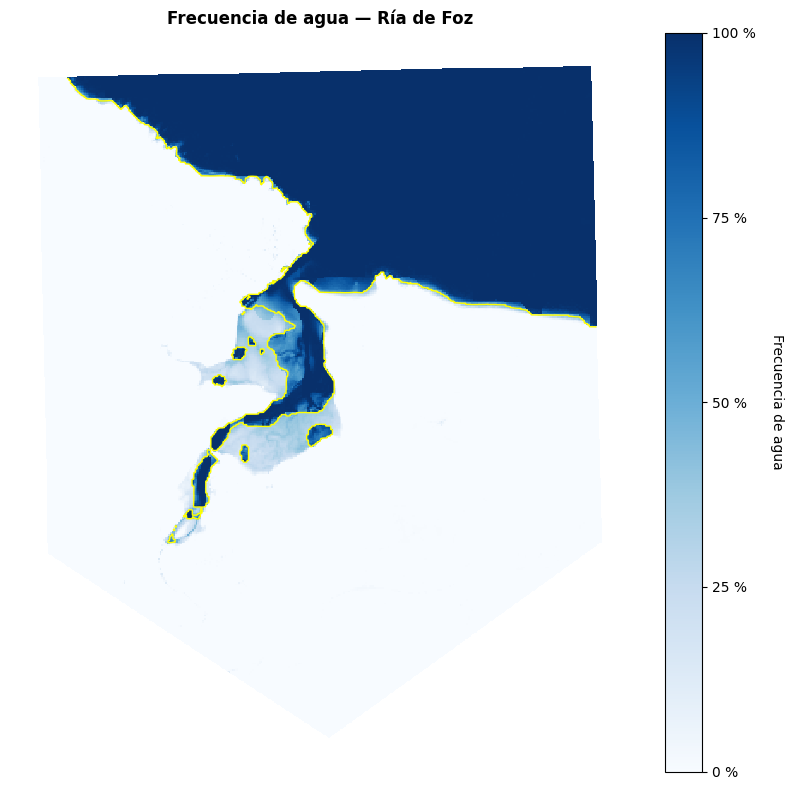

In [15]:
# ── Visualizar el Water Frequency raster ─────────────────────────────────────
# Recarga los módulos para aplicar los últimos ajustes de la función sin
# reiniciar el kernel (conserva water_freq y demás variables ya calculadas).
import importlib, intertidal.visualization, intertidal.notebook_compat
importlib.reload(intertidal.visualization)
importlib.reload(intertidal.notebook_compat)
from intertidal.notebook_compat import plot_water_frequency

# Mismo estilo que los mapas de utils (recorte al AOI + zoom a la ría) y con
# limpieza de parches de agua aislados (falsos positivos dentro del estuario).
#
# Colores (rampa Blues):
#   Blanco (#ffffff)     → 0.0  : nunca visto como agua → tierra firme
#   Azul claro           → ~0.3 : intermitente (zona intertidal alta)
#   Azul medio           → ~0.6 : inundación frecuente (zona intertidal baja)
#   Azul oscuro (#08306b)→ 1.0  : siempre agua → canal permanente
#
# ► min_water_patch_pixels: sube este valor para eliminar parches de agua
#   aislados más grandes (20 px ≈ 0.008 km² a 20m/px). El canal principal,
#   por ser grande y conexo, no se elimina.

plot_water_frequency(
    water_freq,
    transform=wf_transform,        # Georreferencia el raster
    crs=wf_crs,                    # CRS del raster (UTM zona 29N)
    polygon=polygon,               # Recorte + zoom al AOI de la ría
    title="Frecuencia de agua — Ría de Foz",
    min_water_patch_pixels=20,     # ← parches de agua < 20 px se descartan
    water_presence_threshold=0.15, # ← umbral para considerar un píxel "agua"
)


MÁSCARA INTERTIDAL — Ría de Foz
─────────────────────────────────────
Zona de transición (reference map):   62,639 px
  → intertidal (0.05 ≤ WF ≤ 0.95):   32,497 px  (13.00 km²)
  → tierra (WF < 0.05):               20,525 px
  → canal (WF > 0.95):                 9,617 px

GeoTIFF georreferenciado guardado en: intertidal_mask.tif


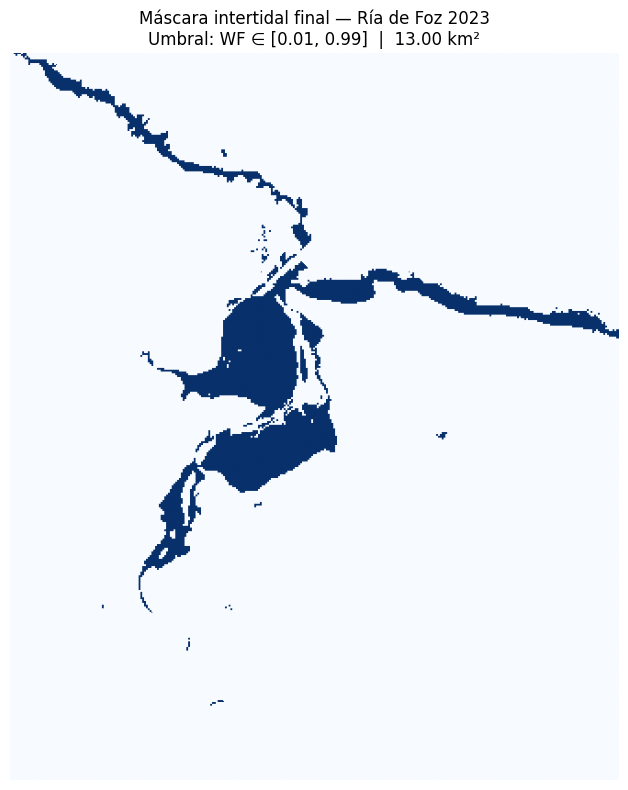

In [16]:
# ── Creación de la máscara intertidal final — PASO 7 ─────────────────────────
# Combina el water frequency raster (PASO 6) con el reference map (PASO 4)
# para obtener la máscara intertidal definitiva.
#
# La zona intertidal se define como los píxeles que cumplen TODAS las condiciones:
#   1. reference_map == 0   → están en la zona de transición
#   2. water_freq > low_thr → se ven como agua al menos "low_thr" del tiempo
#                              (descarta tierra firme que rozó el agua puntualmente)
#   3. water_freq < high_thr→ no se ven como agua siempre
#                              (descarta el canal permanente)
#
# Los umbrales estándar de FAST/OITC (Intertidal Science):
#   low  = 0.05  → 5% del tiempo bajo el agua = límite tierra/intertidal alta
#   high = 0.95  → 95% del tiempo bajo el agua = límite intertidal baja/canal

low_threshold  = 0.01   # Frecuencia mínima para ser considerado intertidal
high_threshold = 0.99   # Frecuencia máxima para no ser considerado canal

# La máscara intertidal final combina los tres criterios
intertidal_mask = (
    (reference_map_openeo == 0)          # Criterio 1: zona de transición
    & (water_freq > low_threshold)       # Criterio 2: inundado > 5% del tiempo
    & (water_freq < high_threshold)      # Criterio 3: no siempre inundado
)

# ── Estadísticas ──────────────────────────────────────────────────────────────
total_intertidal = intertidal_mask.sum()
area_km2 = total_intertidal * (20 * 20) / 1e6  # píxeles × (20m)² → km²

print(f"MÁSCARA INTERTIDAL — Ría de Foz")
print(f"─────────────────────────────────────")
print(f"Zona de transición (reference map): {(reference_map_openeo==0).sum():>8,} px")
print(f"  → intertidal (0.05 ≤ WF ≤ 0.95): {total_intertidal:>8,} px  ({area_km2:.2f} km²)")
print(f"  → tierra (WF < 0.05):             {((reference_map_openeo==0) & (water_freq <= low_threshold)).sum():>8,} px")
print(f"  → canal (WF > 0.95):              {((reference_map_openeo==0) & (water_freq >= high_threshold)).sum():>8,} px")

# ── Guardar la máscara como GeoTIFF ──────────────────────────────────────────
# Si wf_transform y wf_crs están disponibles, el GeoTIFF estará georreferenciado.
# Si no (problema conocido con NetCDF), se guarda sin CRS.
intertidal_out_path = "intertidal_mask.tif"

if wf_transform is not None and wf_crs is not None:
    # Guardar con metadatos espaciales completos
    import rasterio
    from rasterio.transform import from_bounds
    height, width = intertidal_mask.shape
    with rasterio.open(
        intertidal_out_path,
        "w",
        driver="GTiff",
        height=height,
        width=width,
        count=1,
        dtype="uint8",
        crs=wf_crs,
        transform=wf_transform,
    ) as dst:
        dst.write(intertidal_mask.astype("uint8"), 1)
    print(f"\nGeoTIFF georreferenciado guardado en: {intertidal_out_path}")
else:
    # Guardar sin georreferenciación (problema conocido: rioxarray no extrae CRS del NetCDF)
    import rasterio
    height, width = intertidal_mask.shape
    with rasterio.open(
        intertidal_out_path,
        "w",
        driver="GTiff",
        height=height,
        width=width,
        count=1,
        dtype="uint8",
    ) as dst:
        dst.write(intertidal_mask.astype("uint8"), 1)
    print(f"\nGeoTIFF guardado SIN georreferenciación en: {intertidal_out_path}")
    print("  ⚠ Nota: wf_transform/wf_crs = None (problema conocido con rioxarray+NetCDF)")

# ── Visualización final ───────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(intertidal_mask, cmap="Blues")
ax.set_title(
    "Máscara intertidal final — Ría de Foz 2023\n"
    f"Umbral: WF ∈ [{low_threshold:.2f}, {high_threshold:.2f}]  |  "
    f"{area_km2:.2f} km²"
)
ax.axis("off")
plt.tight_layout()
plt.show()


In [17]:
# ── Definir bbox del parche del sur (coordenadas manuales) ───────────────────

# Coordenadas del parche del sur (vértices en lat/lon decimal)
patch_coords = [
    (43.540175, -7.265872),   # 43°32'24.63"N 7°15'57.14"W
    (43.541950, -7.268600),   # 43°32'31.02"N 7°16'06.96"W  
    (43.545567, -7.263369),   # 43°32'44.04"N 7°15'48.13"W
    (43.544197, -7.261803),   # 43°32'39.11"N 7°15'42.49"W
]

# Calcular bbox (envolvente rectangular)
lats = [coord[0] for coord in patch_coords]
lons = [coord[1] for coord in patch_coords]

patch_bbox = {
    "west": min(lons),
    "south": min(lats),
    "east": max(lons),
    "north": max(lats),
    "crs": "EPSG:4326"
}

print("── Bbox del parche del sur ──")
print(f"  Sur:    {patch_bbox['south']:.6f}°")
print(f"  Norte:  {patch_bbox['north']:.6f}°")
print(f"  Oeste:  {patch_bbox['west']:.6f}°")
print(f"  Este:   {patch_bbox['east']:.6f}°")
print(f"  CRS:    {patch_bbox['crs']}")

# Guardar para las celdas siguientes
south_patch_info = {
    "bbox": patch_bbox,
}

print(f"\n✓ Bbox del parche del sur definido. Siguiente paso: descargar RGB+SCL de esa región.")


── Bbox del parche del sur ──
  Sur:    43.540175°
  Norte:  43.545567°
  Oeste:  -7.268600°
  Este:   -7.261803°
  CRS:    EPSG:4326

✓ Bbox del parche del sur definido. Siguiente paso: descargar RGB+SCL de esa región.


In [18]:
# ── Descargar RGB y SCL del parche del sur (PRUEBA: máximo 30 fechas) ────
import os
import tempfile
from pathlib import Path

# Crear directorio temporal para los recortes del parche
patch_dir = Path(tempfile.gettempdir()) / "foz_patch_south"
patch_dir.mkdir(exist_ok=True)
patch_rgb_dir = patch_dir / "rgb"
patch_scl_dir = patch_dir / "scl"
patch_rgb_dir.mkdir(exist_ok=True)
patch_scl_dir.mkdir(exist_ok=True)

# Limitar a máximo 30 fechas para prueba
max_dates = min(30, len(valid_dates_for_wf))
dates_to_download = valid_dates_for_wf[:max_dates]

print(f"Descargando RGB y SCL del parche del sur ({max_dates} fechas)")
print(f"Directorio temporal: {patch_dir}")
print(f"Bbox parche: {south_patch_info['bbox']}\n")

bbox_patch = south_patch_info["bbox"]

# Descargar cada fecha
for i, date in enumerate(dates_to_download, 1):
    print(f"[{i:2d}/{max_dates}] {date} ", end="", flush=True)
    
    # Verificar si ya existe (caché)
    rgb_path = patch_rgb_dir / f"rgb_{date}.tif"
    scl_path = patch_scl_dir / f"scl_{date}.tif"
    
    if rgb_path.exists() and scl_path.exists():
        print("✓ (caché)")
        continue
    
    try:
        # Período de 1 día
        time_extent_single = [date, date]
        
        # ── RGB ──────────────────────────────────────────────────
        s2_cube_rgb = conn.load_collection(
            "SENTINEL2_L2A",
            spatial_extent=bbox_patch,
            temporal_extent=time_extent_single,
            bands=["B04", "B03", "B02"],  # RGB
        )
        s2_cube_rgb = s2_cube_rgb.apply(lambda x: x * 10000)
        s2_cube_rgb.download(str(rgb_path), format="GTiff")
        
        # ── SCL ──────────────────────────────────────────────────
        s2_cube_scl = conn.load_collection(
            "SENTINEL2_L2A",
            spatial_extent=bbox_patch,
            temporal_extent=time_extent_single,
            bands=["SCL"],
        )
        s2_cube_scl.download(str(scl_path), format="GTiff")
        
        print("✓")
        
    except Exception as e:
        print(f"✗ {str(e)[:50]}")
        continue

print(f"\n✓ Descarga completada:")
print(f"  RGB: {len(list(patch_rgb_dir.glob('*.tif')))} archivos")
print(f"  SCL: {len(list(patch_scl_dir.glob('*.tif')))} archivos")
print(f"  Ruta: {patch_dir}")

# Guardar rutas
south_patch_info["rgb_dir"] = patch_rgb_dir
south_patch_info["scl_dir"] = patch_scl_dir

Descargando RGB y SCL del parche del sur (30 fechas)
Directorio temporal: C:\Users\Jorge\AppData\Local\Temp\foz_patch_south
Bbox parche: {'west': -7.2686, 'south': 43.540175, 'east': -7.261803, 'north': 43.545567, 'crs': 'EPSG:4326'}

[ 1/30] 2015-07-25 ✓ (caché)
[ 2/30] 2015-08-04 ✓ (caché)
[ 3/30] 2015-08-17 ✗ ('Connection aborted.', ConnectionResetError(10054
[ 4/30] 2015-10-23 ✓ (caché)
[ 5/30] 2015-11-12 ✓ (caché)
[ 6/30] 2015-11-15 

✗ HTTPSConnectionPool(host='openeo.dataspace.coperni
[ 7/30] 2016-01-11 

✗ HTTPSConnectionPool(host='openeo.dataspace.coperni
[ 8/30] 2016-03-14 

✗ HTTPSConnectionPool(host='openeo.dataspace.coperni
[ 9/30] 2016-04-30 

✗ HTTPSConnectionPool(host='openeo.dataspace.coperni
[10/30] 2016-07-09 ✓ (caché)
[11/30] 2016-07-19 ✓ (caché)
[12/30] 2016-07-22 

✗ HTTPSConnectionPool(host='openeo.dataspace.coperni
[13/30] 2016-08-01 

✗ HTTPSConnectionPool(host='openeo.dataspace.coperni
[14/30] 2016-08-18 ✓ (caché)
[15/30] 2016-08-21 

✗ HTTPSConnectionPool(host='openeo.dataspace.coperni
[16/30] 2016-09-07 

✗ HTTPSConnectionPool(host='openeo.dataspace.coperni
[17/30] 2016-10-07 ✓ (caché)
[18/30] 2016-10-10 

✗ HTTPSConnectionPool(host='openeo.dataspace.coperni
[19/30] 2016-11-16 

✓
[20/30] 2016-12-29 ✓
[21/30] 2017-01-08 ✓
[22/30] 2017-01-25 ✓ (caché)
[23/30] 2017-02-17 

✗ [429] Too Many Requests
[24/30] 2017-03-09 ✓
[25/30] 2017-03-16 ✓ (caché)
[26/30] 2017-04-08 ✓
[27/30] 2017-04-13 

✗ [429] Too Many Requests
[28/30] 2017-04-23 

✗ [429] Too Many Requests
[29/30] 2017-04-28 ✓
[30/30] 2017-05-30 ✓ (caché)

✓ Descarga completada:
  RGB: 17 archivos
  SCL: 17 archivos
  Ruta: C:\Users\Jorge\AppData\Local\Temp\foz_patch_south


Visualizando 15 fechas del parche sur (RGB | SCL)



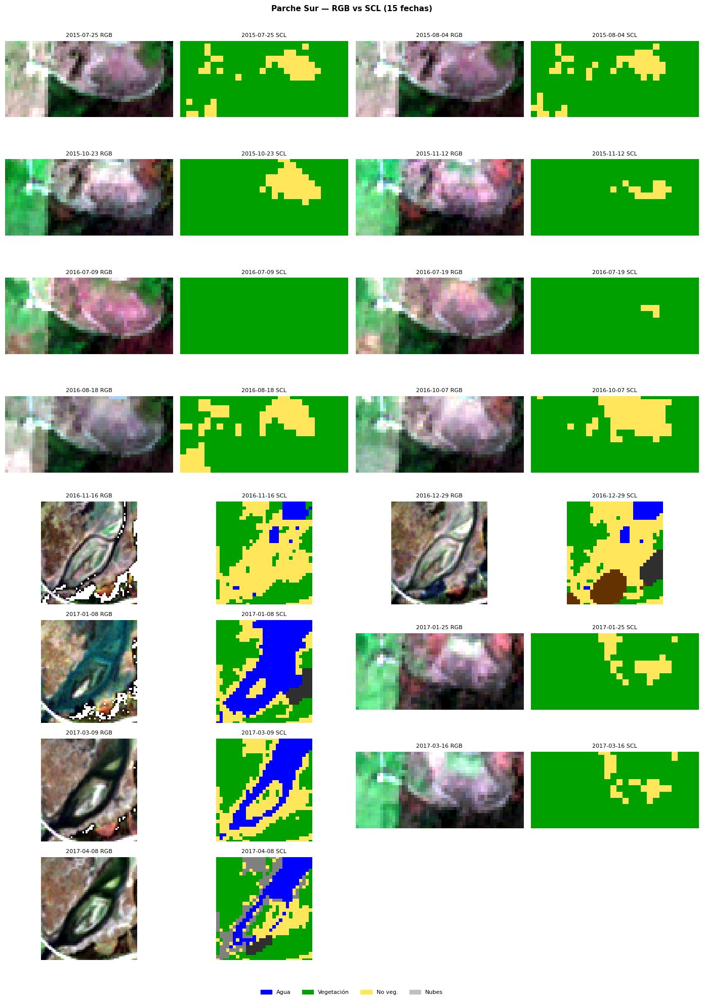


🔍 Verificación:
  ✓ Si RGB muestra AGUA (oscuro) y SCL marca AZUL → correcto
  ✗ Si RGB muestra VEGETACIÓN (verde) y SCL marca AZUL → error clasificación


In [19]:
# ── Visualización: RGB vs SCL del parche del sur ─────────────────────────────
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import rasterio
from math import ceil

# Colores para las clases SCL (según Sentinel-2)
scl_colors = {
    0: [0, 0, 0],           # No Data (negro)
    1: [255, 0, 0],         # Saturated (rojo)
    2: [47, 47, 47],        # Dark Area (gris oscuro)
    3: [100, 50, 0],        # Cloud Shadows (marrón)
    4: [0, 160, 0],         # Vegetation (verde)
    5: [255, 230, 90],      # Not Vegetated (amarillo)
    6: [0, 0, 255],         # Water (azul)
    7: [128, 128, 128],     # Unclassified (gris)
    8: [192, 192, 192],     # Cloud Medium (gris claro)
    9: [255, 255, 255],     # Cloud High (blanco)
    10: [100, 200, 255],    # Thin Cirrus (azul claro)
    11: [255, 150, 255],    # Snow / Ice (magenta)
}

def colorize_scl(scl_arr):
    """Convierte SCL a RGB coloreado."""
    h, w = scl_arr.shape
    rgb = np.zeros((h, w, 3), dtype=np.uint8)
    for scl_val, color in scl_colors.items():
        rgb[scl_arr == scl_val] = color
    return rgb

# Obtener archivos descargados
rgb_dir = south_patch_info["rgb_dir"]
scl_dir = south_patch_info["scl_dir"]
rgb_files = sorted(rgb_dir.glob("rgb_*.tif"))

# Mostrar primeras 15 fechas
max_display = min(15, len(rgb_files))
rgb_files = rgb_files[:max_display]

print(f"Visualizando {max_display} fechas del parche sur (RGB | SCL)\n")

# Layout: 2 columnas por fecha
n_cols = 4  # 2 pares por fila
n_rows = ceil(len(rgb_files) / (n_cols // 2))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, n_rows * 2.5), squeeze=False)
axes = axes.ravel()

for i, rgb_file in enumerate(rgb_files):
    date = rgb_file.stem.replace("rgb_", "")
    scl_file = scl_dir / f"scl_{date}.tif"
    
    ax_rgb = axes[i * 2]
    ax_scl = axes[i * 2 + 1]
    
    # ── RGB ──────────────────────────────────────────────────────────
    try:
        with rasterio.open(rgb_file) as src:
            rgb = src.read([1, 2, 3]).transpose(1, 2, 0).astype(np.float32)
        
        # Normalizar por percentiles
        rgb[rgb < 0] = np.nan
        valid_mask = np.all(np.isfinite(rgb), axis=-1)
        
        rgb_norm = np.zeros_like(rgb)
        for b in range(3):
            band = rgb[:, :, b]
            valid = band[valid_mask]
            if valid.size > 0:
                p2, p98 = np.percentile(valid, [2, 98])
                rgb_norm[:, :, b] = np.clip((band - p2) / (p98 - p2 + 1e-6), 0, 1)
        
        rgb_norm[~valid_mask] = 1.0  # Blanco para NaN
        
        ax_rgb.imshow(rgb_norm)
        ax_rgb.set_title(f"{date} RGB", fontsize=8)
        ax_rgb.axis("off")
        
    except Exception as e:
        ax_rgb.text(0.5, 0.5, f"Error\n{str(e)[:30]}", 
                    ha="center", va="center", fontsize=7)
        ax_rgb.axis("off")
    
    # ── SCL ──────────────────────────────────────────────────────────
    try:
        with rasterio.open(scl_file) as src:
            scl = src.read(1).astype(np.uint8)
        
        ax_scl.imshow(colorize_scl(scl))
        ax_scl.set_title(f"{date} SCL", fontsize=8)
        ax_scl.axis("off")
        
    except Exception as e:
        ax_scl.text(0.5, 0.5, f"Error\n{str(e)[:30]}", 
                    ha="center", va="center", fontsize=7)
        ax_scl.axis("off")

# Ocultar paneles vacíos
for j in range(len(rgb_files) * 2, len(axes)):
    axes[j].axis("off")

# Leyenda SCL
legend_patches = [
    mpatches.Patch(color=np.array(scl_colors[6]) / 255, label="Agua"),
    mpatches.Patch(color=np.array(scl_colors[4]) / 255, label="Vegetación"),
    mpatches.Patch(color=np.array(scl_colors[5]) / 255, label="No veg."),
    mpatches.Patch(color=np.array(scl_colors[8]) / 255, label="Nubes"),
]
fig.legend(handles=legend_patches, loc="lower center", ncol=4, 
           fontsize=8, frameon=False)

plt.suptitle(f"Parche Sur — RGB vs SCL ({max_display} fechas)", 
             fontsize=11, fontweight="bold")
plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.show()

print(f"\n🔍 Verificación:")
print(f"  ✓ Si RGB muestra AGUA (oscuro) y SCL marca AZUL → correcto")
print(f"  ✗ Si RGB muestra VEGETACIÓN (verde) y SCL marca AZUL → error clasificación")

### Diagnóstico: parche intermareal del sur

Investigación de un parche intermareal detectado en el extremo sur de la ría que, al contrastar con observaciones de campo, muestra discrepancias con la realidad:

- **Observación sobre el terreno**: vegetación presente en esa zona.
- **Clasificación del modelo**: píxeles marcados como intertidales (frecuencia de agua intermedia).

Hipótesis a contrastar:
- ¿El SCL clasifica erróneamente vegetación como agua en esa zona?
- ¿La frecuencia de agua está inflada por falsos positivos (sombras, nubes mal clasificadas)?
- ¿Es un artefacto del reference map (zona de transición mal delimitada)?

Esta celda identifica el parche, extrae sus estadísticas y muestra las escenas que contribuyen a su clasificación.


## 15 · Fichas válidas finales y descarga RGB de validación

Resumen de todas las fechas que superan el pipeline completo. Se distinguen dos categorías:
- **[ref]** — calidad de referencia (≤5% píxeles malos en todo el AOI); usadas para construir el reference map.
- **[✓]** — recuperadas por el filtro de transición (>5% global pero ≤20% de nubes en la zona intermareal).

A continuación se descargan imágenes RGB de una muestra de las fechas **[✓]** para validarlas visualmente.

In [20]:
# ── Lista de fichas válidas finales ──────────────────────────────────────────
# Lista completa de 303 fechas válidas de Sentinel-2 para Foz (2015-2024)
# Incluye:
#   [ref] — 275 fechas con ≤5% píxeles malos globales (calidad reference map)
#   [✓]   — 28 fechas recuperadas por el filtro de transición
#            (>5% global pero ≤10% de nubes en la zona de transición)

# Fechas de referencia (≤5% global) - 275 fechas
dates_ref_quality = [
    "2015-07-25", "2015-08-04", "2015-10-23", "2015-11-12", "2015-11-15",
    "2016-01-11", "2016-03-14", "2016-04-30", "2016-07-09", "2016-07-19",
    "2016-08-01", "2016-08-18", "2016-08-21", "2016-09-07", "2016-10-07",
    "2016-10-10", "2016-11-16", "2016-12-29", "2017-01-08", "2017-01-25",
    "2017-02-17", "2017-03-09", "2017-03-16", "2017-04-08", "2017-04-13",
    "2017-04-23", "2017-04-28", "2017-06-07", "2017-06-14", "2017-06-17",
    "2017-07-02", "2017-07-17", "2017-08-03", "2017-08-11", "2017-08-16",
    "2017-08-21", "2017-09-02", "2017-09-05", "2017-10-02", "2017-10-07",
    "2017-10-10", "2017-10-12", "2017-10-20", "2017-10-27", "2017-11-14",
    "2017-11-19", "2017-11-26", "2017-12-21", "2017-12-24", "2018-01-18",
    "2018-01-28", "2018-02-17", "2018-02-22", "2018-02-24", "2018-04-03",
    "2018-05-15", "2018-06-14", "2018-06-17", "2018-06-24", "2018-07-12",
    "2018-08-06", "2018-08-11", "2018-08-21", "2018-08-26", "2018-08-31",
    "2018-09-10", "2018-09-17", "2018-09-20", "2018-09-22", "2018-09-25",
    "2018-10-02", "2018-10-05", "2018-10-10", "2018-10-12", "2018-10-25",
    "2018-11-14", "2018-11-16", "2018-11-19", "2018-12-09", "2018-12-26",
    "2018-12-31", "2019-01-03", "2019-01-05", "2019-02-12", "2019-02-14",
    "2019-02-24", "2019-03-11", "2019-03-16", "2019-03-26", "2019-03-29",
    "2019-03-31", "2019-04-08", "2019-04-13", "2019-04-20", "2019-05-03",
    "2019-05-13", "2019-05-28", "2019-05-30", "2019-07-12", "2019-07-24",
    "2019-08-03", "2019-08-13", "2019-08-16", "2019-09-02", "2019-09-07",
    "2019-09-12", "2019-10-07", "2019-10-10", "2019-10-25", "2019-11-29",
    "2019-12-04", "2019-12-26", "2019-12-29", "2019-12-31", "2020-01-05",
    "2020-01-25", "2020-01-28", "2020-02-07", "2020-02-19", "2020-02-24",
    "2020-03-10", "2020-03-18", "2020-03-25", "2020-03-28", "2020-04-04",
    "2020-05-07", "2020-05-17", "2020-05-19", "2020-05-27", "2020-06-01",
    "2020-07-03", "2020-07-18", "2020-07-26", "2020-08-05", "2020-09-04",
    "2020-09-16", "2020-09-29", "2020-10-16", "2020-10-29", "2020-11-13",
    "2020-11-18", "2020-11-20", "2020-12-28", "2021-01-12", "2021-01-22",
    "2021-02-23", "2021-03-15", "2021-03-25", "2021-03-28", "2021-04-02",
    "2021-04-04", "2021-04-07", "2021-04-09", "2021-04-12", "2021-04-17",
    "2021-05-19", "2021-05-29", "2021-07-01", "2021-07-16", "2021-07-26",
    "2021-08-10", "2021-08-12", "2021-09-04", "2021-09-11", "2021-10-06",
    "2021-10-11", "2021-10-19", "2021-11-10", "2021-11-13", "2021-11-18",
    "2021-11-20", "2021-11-30", "2021-12-13", "2021-12-18", "2021-12-30",
    "2022-01-12", "2022-01-14", "2022-01-17", "2022-01-19", "2022-01-22",
    "2022-01-24", "2022-01-27", "2022-02-08", "2022-03-18", "2022-03-23",
    "2022-04-02", "2022-06-18", "2022-06-28", "2022-07-01", "2022-07-08",
    "2022-07-11", "2022-07-23", "2022-08-20", "2022-09-09", "2022-09-19",
    "2022-09-21", "2022-10-04", "2022-11-03", "2022-11-13", "2022-11-23",
    "2022-11-25", "2022-12-10", "2023-01-02", "2023-01-09", "2023-02-01",
    "2023-02-03", "2023-02-08", "2023-02-11", "2023-02-16", "2023-03-05",
    "2023-03-10", "2023-03-15", "2023-03-20", "2023-03-28", "2023-04-02",
    "2023-04-17", "2023-04-19", "2023-04-29", "2023-05-07", "2023-05-17",
    "2023-05-29", "2023-06-11", "2023-06-13", "2023-06-28", "2023-07-01",
    "2023-07-21", "2023-07-23", "2023-07-26", "2023-07-31", "2023-08-05",
    "2023-08-07", "2023-08-10", "2023-08-17", "2023-09-14", "2023-09-24",
    "2023-10-09", "2023-10-21", "2023-11-15", "2023-12-18", "2023-12-25",
    "2023-12-30", "2024-01-07", "2024-01-14", "2024-01-19", "2024-01-24",
    "2024-02-03", "2024-02-06", "2024-02-16", "2024-03-04", "2024-03-12",
    "2024-03-14", "2024-04-01", "2024-04-21", "2024-05-08", "2024-05-11",
    "2024-06-02", "2024-07-12", "2024-07-22", "2024-07-30", "2024-08-11",
    "2024-08-14", "2024-08-16", "2024-08-19", "2024-08-26", "2024-09-15",
    "2024-09-18", "2024-09-23", "2024-09-28", "2024-10-13", "2024-10-23",
    "2024-11-02", "2024-11-07", "2024-11-29", "2024-12-07", "2024-12-14",
]

# Fechas recuperadas por transición (>5% global, ≤10% en estuario) - 28 fechas
dates_transition_only = [
    "2015-08-17", "2016-07-22", "2017-05-30", "2017-08-13", "2017-11-16",
    "2018-02-12", "2018-09-02", "2018-10-17", "2019-02-19", "2019-05-25",
    "2019-07-29", "2019-08-21", "2019-11-16", "2020-01-15", "2020-05-29",
    "2020-11-30", "2021-02-13", "2022-02-06", "2022-04-09", "2022-07-31",
    "2023-02-06", "2023-04-27", "2023-07-18", "2023-09-26", "2023-11-23",
    "2023-12-13", "2024-05-28", "2024-08-04",
]

print("═" * 60)
print(f"  FICHAS VÁLIDAS FINALES — Foz  (2015-2024)")
print("═" * 60)
print()
print(f"  [ref]  Calidad de referencia (≤5% global): {len(dates_ref_quality):3d} fechas")
print(f"  [✓]   Recuperadas por transición (>5% global, ≤10% en estuario): {len(dates_transition_only):3d} fechas")

# Combinar ambas listas en all_valid_dates
all_valid_dates = sorted(dates_ref_quality + dates_transition_only)

print()
print("─" * 60)
print(f"  TOTAL fichas válidas: {len(all_valid_dates):3d}")
print("═" * 60)

# ── Variable reutilizable para el modelo de mareas ────────────────────────────
# Lista ordenada de todas las fechas válidas del pipeline.
# Se puede usar directamente en análisis futuros (p. ej. serie temporal de mareas).
valid_scene_dates = all_valid_dates   # lista de strings ISO "YYYY-MM-DD"

print(f"\nGuardado como `valid_scene_dates` ({len(valid_scene_dates)} fechas)")
print(f"\n  Distribución por año:")
for year in range(2015, 2025):
    year_str = str(year)
    count = len([d for d in valid_scene_dates if d.startswith(year_str)])
    print(f"    {year}: {count:3d} fechas")


════════════════════════════════════════════════════════════
  FICHAS VÁLIDAS FINALES — Foz  (2015-2024)
════════════════════════════════════════════════════════════

  [ref]  Calidad de referencia (≤5% global): 275 fechas
  [✓]   Recuperadas por transición (>5% global, ≤10% en estuario):  28 fechas

────────────────────────────────────────────────────────────
  TOTAL fichas válidas: 303
════════════════════════════════════════════════════════════

Guardado como `valid_scene_dates` (303 fechas)

  Distribución por año:
    2015:   6 fechas
    2016:  14 fechas
    2017:  34 fechas
    2018:  35 fechas
    2019:  38 fechas
    2020:  32 fechas
    2021:  33 fechas
    2022:  30 fechas
    2023:  45 fechas
    2024:  36 fechas


Fechas [✓] con RGB en disco:          4
  → cobertura ≥ 60%:              4

── Cobertura del tile ──
  2020-01-15   9.5% nubes · 100% tile
  2020-05-29   7.9% nubes · 100% tile
  2024-05-28   6.9% nubes · 100% tile
  2024-08-04   8.1% nubes · 70% tile

  Mostrando (4): ['2020-01-15', '2020-05-29', '2024-05-28', '2024-08-04']


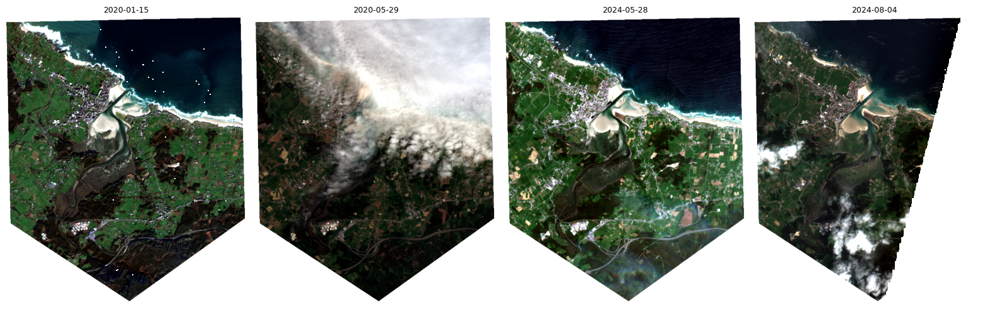

In [21]:
# ── Descarga RGB para validación visual — fechas recuperadas por transición ───
# Las imágenes con corte diagonal son fechas en que el tile de Sentinel-2
# no cubría completamente el bbox (límite orbital). Se escanean TODAS las
# fechas de transición en busca de imágenes ya descargadas con buena cobertura,
# y si no hay suficientes se descarga una muestra mayor para tener dónde elegir.
#
# ► Ajusta n_download  : cuántas fechas descargar si faltan (None = todas).
# ► Ajusta min_coverage: umbral mínimo de cobertura del tile (0–1).
# ► Ajusta n_show      : cuántas imágenes mostrar en el grid final.

n_download   = 25  # ← fechas a descargar si no hay suficientes en disco
min_coverage = 0.6# ← descartar imágenes con <70% del bbox cubierto
n_show       = 4    # ← imágenes a mostrar en el grid

# ── Cobertura real del tile: fracción de píxeles con datos (no-negro) ─────────
def rgb_coverage(date, rgb_dir):
    path = os.path.join(rgb_dir, f"rgb_{date}.tif")
    if not os.path.exists(path):
        return None
    with rasterio.open(path) as src:
        arr = src.read()
    return np.any(arr > 0, axis=0).mean()

# Paso 1: escanear fechas que ya están en disco
already_ok = {
    d: rgb_coverage(d, dir_rgb)
    for d in dates_transition_only
    if os.path.exists(os.path.join(dir_rgb, f"rgb_{d}.tif"))
}
good_on_disk = [d for d, cov in already_ok.items() if cov is not None and cov >= min_coverage]

print(f"Fechas [✓] con RGB en disco:          {len(already_ok)}")
print(f"  → cobertura ≥ {min_coverage*100:.0f}%:              {len(good_on_disk)}")

# Paso 2: descargar más si no tenemos suficientes
results_rgb_transition = {d: "skipped" for d in already_ok}

if len(good_on_disk) < n_show:
    pending = [d for d in dates_transition_only if d not in already_ok]
    to_dl   = pending[:n_download] if n_download else pending
    print(f"\nDescargando {len(to_dl)} fechas adicionales para buscar cobertura completa…\n")
    for date in to_dl:
        pct = transition_stats[date]["bad_pct"]
        print(f"  → {date}  [{pct:.1f}% nubes en transición]")
        status = download_date_rgb(conn, date, bbox, dir_rgb)
        results_rgb_transition[date] = status
        if status in ("ok", "skipped"):
            cov = rgb_coverage(date, dir_rgb)
            already_ok[date] = cov
            if cov is not None and cov >= min_coverage:
                good_on_disk.append(date)
                good_on_disk = sorted(set(good_on_disk))
                if len(good_on_disk) >= n_show:
                    print(f"  ✓ Ya tenemos {n_show} imágenes con cobertura suficiente — parando.")
                    break

# Paso 3: tabla de cobertura y grid
print("\n── Cobertura del tile ──")
for d in sorted(already_ok):
    cov  = already_ok[d]
    flag = "" if (cov is not None and cov >= min_coverage) else "  ← omitida (tile parcial)"
    if cov is not None:
        print(f"  {d}   {transition_stats[d]['bad_pct']:.1f}% nubes · {cov*100:.0f}% tile{flag}")
    else:
        print(f"  {d}   sin datos")

dates_show = sorted(good_on_disk)[:n_show]
print(f"\n  Mostrando ({len(dates_show)}): {dates_show}")

if dates_show:
    plot_rgb_grid(
        dates=dates_show,
        rgb_dir=dir_rgb,
        polygon=polygon,
        title=f"Validación visual — fechas [✓] recuperadas por transición — {site}  (tile ≥ {min_coverage*100:.0f}%)",
        cols=min(4, len(dates_show)),
    )
else:
    print(f"Ninguna imagen supera el umbral de cobertura ({min_coverage*100:.0f}%). Reduce min_coverage o aumenta n_download.")


## 🔍 Debugging SCL — Análisis detallado de una imagen específica

Esta sección crea visualizaciones diagnósticas para verificar si la clasificación SCL es correcta y entender por qué una imagen que visualmente parece válida tiene un bajo porcentaje de nubes en la zona de transición.

In [22]:
# ════════════════════════════════════════════════════════════════════════════
# DEBUGGING: Análisis SCL detallado de la imagen de prueba
# ════════════════════════════════════════════════════════════════════════════
# Este análisis genera visualizaciones completas para entender la clasificación
# SCL de una imagen que ha sido marcada como válida pero que aparentemente
# tiene un bajo porcentaje de cobertura en la zona de transición.

# ── Definir la imagen a analizar ──────────────────────────────────────────────
debug_date = "2020-05-29"  # Fecha de la imagen adjunta a analizar

# ── Cargar datos ──────────────────────────────────────────────────────────────
scl_path_debug = os.path.join(dir_scl, f"scl_{debug_date}.tif")
rgb_path_debug = os.path.join(dir_rgb, f"rgb_{debug_date}.tif")

if not os.path.exists(scl_path_debug):
    print(f"⚠️ ERROR: No existe {scl_path_debug}")
    print(f"   Verifica que la fecha {debug_date} esté descargada.")
else:
    print(f"✓ Analizando fecha: {debug_date}")
    print(f"  SCL: {scl_path_debug}")
    print(f"  RGB: {rgb_path_debug}")
    
    # Cargar arrays
    scl_debug = tif_to_scl(scl_path_debug)
    
    rgb_debug = None
    if os.path.exists(rgb_path_debug):
        rgb_debug = tif_to_rgb(rgb_path_debug)
    
    # ── Calcular estadísticas globales ────────────────────────────────────────
    bad_mask_debug = np.isin(scl_debug, scl_bad_classes)
    bad_fraction_debug = bad_mask_debug.sum() / bad_mask_debug.size
    
    # ── Calcular estadísticas en transición ───────────────────────────────────
    stats_transition_debug = compute_transition_cloud_stats(
        scl_debug,
        transition_mask,
        scl_bad_classes,
    )
    
    # ── Histograma de clases SCL ──────────────────────────────────────────────
    unique_classes, counts = np.unique(scl_debug, return_counts=True)
    total_pixels = scl_debug.size
    
    print(f"\n{'='*70}")
    print(f"RESUMEN ESTADÍSTICO — {debug_date}")
    print(f"{'='*70}")
    print(f"  Dimensiones:          {scl_debug.shape[0]} × {scl_debug.shape[1]} px")
    print(f"  Total píxeles:        {total_pixels:,}")
    print(f"\n  FILTRO GLOBAL:")
    print(f"    Píxeles malos:      {bad_mask_debug.sum():,} ({100*bad_fraction_debug:.2f}%)")
    print(f"\n  FILTRO EN TRANSICIÓN:")
    print(f"    Píxeles en zona:    {stats_transition_debug['total_transition_px']:,}")
    print(f"    Píxeles malos:      {stats_transition_debug['bad_count']:,} ({stats_transition_debug['bad_pct']:.2f}%)")
    print(f"\n  DISTRIBUCIÓN DE CLASES SCL:")
    
    scl_class_names = {
        0: "Sin datos",
        1: "Saturado/Defectuoso",
        2: "Sombra oscura",
        3: "Sombra nube",
        4: "Vegetación",
        5: "No vegetación",
        6: "Agua",
        7: "Incierto",
        8: "Nube media",
        9: "Nube alta",
        10: "Cirrus",
        11: "Nieve/Hielo",
    }
    
    for cls, count in zip(unique_classes, counts):
        pct = 100 * count / total_pixels
        name = scl_class_names.get(cls, f"Clase {cls}")
        marker = " ← MALO" if cls in scl_bad_classes else ""
        print(f"    Clase {cls:2d} ({name:20s}): {count:8,} px ({pct:5.2f}%){marker}")
    
    print(f"{'='*70}\n")
    
    # ══════════════════════════════════════════════════════════════════════════
    # VISUALIZACIÓN: 6 paneles diagnósticos
    # ══════════════════════════════════════════════════════════════════════════
    
    fig, axes = plt.subplots(2, 3, figsize=(24, 14))
    axes = axes.flatten()
    
    # ── Panel 1: RGB (si disponible) ──────────────────────────────────────────
    if rgb_debug is not None:
        axes[0].imshow(rgb_debug)
        axes[0].set_title(
            f"Panel 1: RGB — {debug_date}\n"
            f"Imagen en color verdadero",
            fontsize=11, fontweight="bold"
        )
    else:
        axes[0].text(0.5, 0.5, "RGB no disponible", 
                     ha="center", va="center", fontsize=14)
        axes[0].set_title(f"Panel 1: RGB — {debug_date}")
    axes[0].axis("off")
    
    # ── Panel 2: SCL completo con colormap grayscale ──────────────────────────
    axes[1].imshow(scl_debug, cmap="gray", vmin=0, vmax=11)
    axes[1].set_title(
        f"Panel 2: SCL completo (escala de grises)\n"
        f"Valores: 0 (negro) → 11 (blanco)",
        fontsize=11, fontweight="bold"
    )
    axes[1].axis("off")
    
    # ── Panel 3: SCL con paleta oficial ESA ───────────────────────────────────
    # Crear colormap personalizado
    scl_colors_hex = [
        "#000000",  # 0: Sin datos
        "#ff0000",  # 1: Saturado
        "#2f2f2f",  # 2: Sombra oscura
        "#643200",  # 3: Sombra nube
        "#00a000",  # 4: Vegetación
        "#ffe65a",  # 5: No vegetación
        "#0000ff",  # 6: Agua
        "#808080",  # 7: Incierto
        "#c0c0c0",  # 8: Nube media
        "#ffffff",  # 9: Nube alta
        "#64c8ff",  # 10: Cirrus
        "#ff96ff",  # 11: Nieve/Hielo
    ]
    
    from matplotlib.colors import ListedColormap
    scl_cmap = ListedColormap(scl_colors_hex)
    
    im = axes[2].imshow(scl_debug, cmap=scl_cmap, vmin=0, vmax=11)
    axes[2].set_title(
        f"Panel 3: SCL con paleta oficial ESA\n"
        f"Verde=vegetación · Azul=agua · Blanco=nubes",
        fontsize=11, fontweight="bold"
    )
    axes[2].axis("off")
    
    # Añadir leyenda de colores (solo clases presentes)
    from matplotlib.patches import Patch
    legend_elements = []
    for cls in unique_classes:
        if cls < len(scl_colors_hex):
            name = scl_class_names.get(cls, f"Clase {cls}")
            legend_elements.append(
                Patch(facecolor=scl_colors_hex[cls], label=f"{cls}: {name}")
            )
    
    axes[2].legend(
        handles=legend_elements,
        loc="upper left",
        bbox_to_anchor=(1.02, 1),
        fontsize=9,
        framealpha=0.9
    )
    
    # ── Panel 4: Píxeles malos (global) ───────────────────────────────────────
    axes[3].imshow(bad_mask_debug, cmap="Reds", vmin=0, vmax=1)
    axes[3].set_title(
        f"Panel 4: Píxeles malos (global)\n"
        f"{100*bad_fraction_debug:.2f}% del total",
        fontsize=11, fontweight="bold"
    )
    axes[3].axis("off")
    
    # ── Panel 5: Zona de transición (máscara) ─────────────────────────────────
    axes[4].imshow(transition_mask, cmap="Blues", vmin=0, vmax=1)
    axes[4].set_title(
        f"Panel 5: Zona de transición\n"
        f"{transition_mask.sum():,} píxeles intermareales",
        fontsize=11, fontweight="bold"
    )
    axes[4].axis("off")
    
    # ── Panel 6: Nubes EN la zona de transición ───────────────────────────────
    clouds_in_transition = bad_mask_debug & transition_mask
    
    axes[5].imshow(clouds_in_transition, cmap="Reds", vmin=0, vmax=1)
    axes[5].set_title(
        f"Panel 6: Nubes EN zona de transición\n"
        f"{stats_transition_debug['bad_pct']:.2f}% (filtro mejorado)",
        fontsize=11, fontweight="bold"
    )
    axes[5].axis("off")
    
    plt.suptitle(
        f"Diagnóstico SCL completo — {debug_date}\n"
        f"Validación de clasificación y cobertura de nubes",
        fontsize=15, fontweight="bold", y=0.98
    )
    plt.tight_layout()
    plt.show()
    
    # ══════════════════════════════════════════════════════════════════════════
    # ANÁLISIS ADICIONAL: Mapa SCL solo de la zona de transición
    # ══════════════════════════════════════════════════════════════════════════
    
    print(f"\n{'='*70}")
    print(f"ANÁLISIS DETALLADO — ZONA DE TRANSICIÓN")
    print(f"{'='*70}")
    
    # Extraer valores SCL solo en la zona de transición
    scl_transition = scl_debug[transition_mask]
    
    unique_transition, counts_transition = np.unique(scl_transition, return_counts=True)
    total_transition = scl_transition.size
    
    print(f"\n  DISTRIBUCIÓN DE CLASES EN ZONA DE TRANSICIÓN:")
    for cls, count in zip(unique_transition, counts_transition):
        pct = 100 * count / total_transition
        name = scl_class_names.get(cls, f"Clase {cls}")
        marker = " ← MALO" if cls in scl_bad_classes else " ← BUENO" if cls in [4, 5, 6] else ""
        print(f"    Clase {cls:2d} ({name:20s}): {count:8,} px ({pct:5.2f}%){marker}")
    
    print(f"\n{'='*70}\n")
    
    # ── Visualización: SCL solo en zona de transición ─────────────────────────
    fig2, ax = plt.subplots(1, 1, figsize=(12, 10))
    
    # Crear una copia del SCL donde se enmascara todo excepto la transición
    scl_masked = np.full_like(scl_debug, fill_value=np.nan, dtype=float)
    scl_masked[transition_mask] = scl_debug[transition_mask]
    
    im2 = ax.imshow(scl_masked, cmap=scl_cmap, vmin=0, vmax=11)
    ax.set_title(
        f"SCL en zona de transición — {debug_date}\n"
        f"Solo se muestran los {total_transition:,} píxeles intermareales\n"
        f"Píxeles malos en transición: {stats_transition_debug['bad_pct']:.2f}%",
        fontsize=13, fontweight="bold"
    )
    ax.axis("off")
    
    # Añadir leyenda
    legend_elements2 = []
    for cls in unique_transition:
        if cls < len(scl_colors_hex):
            name = scl_class_names.get(cls, f"Clase {cls}")
            count = counts_transition[np.where(unique_transition == cls)[0][0]]
            pct = 100 * count / total_transition
            legend_elements2.append(
                Patch(
                    facecolor=scl_colors_hex[cls],
                    label=f"{cls}: {name} ({pct:.1f}%)"
                )
            )
    
    ax.legend(
        handles=legend_elements2,
        loc="upper left",
        bbox_to_anchor=(1.02, 1),
        fontsize=10,
        framealpha=0.95,
        title="Clases SCL en transición"
    )
    
    plt.tight_layout()
    plt.show()
    
    # ══════════════════════════════════════════════════════════════════════════
    # CONCLUSIÓN
    # ══════════════════════════════════════════════════════════════════════════
    
    print(f"\n{'='*70}")
    print(f"CONCLUSIÓN DEL DIAGNÓSTICO")
    print(f"{'='*70}")
    
    # Determinar si la imagen es válida según diferentes criterios
    umbral_global = 0.20
    umbral_transition = 0.20
    
    valida_global = bad_fraction_debug <= umbral_global
    valida_transition = stats_transition_debug['bad_pct'] / 100 <= umbral_transition
    
    print(f"\n  Fecha analizada: {debug_date}")
    print(f"\n  VALIDEZ SEGÚN FILTRO GLOBAL:")
    print(f"    Píxeles malos:  {100*bad_fraction_debug:.2f}%")
    print(f"    Umbral:         {100*umbral_global:.2f}%")
    print(f"    Resultado:      {'✓ VÁLIDA' if valida_global else '✗ RECHAZADA'}")
    
    print(f"\n  VALIDEZ SEGÚN FILTRO EN TRANSICIÓN:")
    print(f"    Píxeles malos:  {stats_transition_debug['bad_pct']:.2f}%")
    print(f"    Umbral:         {100*umbral_transition:.2f}%")
    print(f"    Resultado:      {'✓ VÁLIDA' if valida_transition else '✗ RECHAZADA'}")
    
    if valida_transition and not valida_global:
        print(f"\n  💡 INSIGHT:")
        print(f"     El filtro en transición ACEPTA esta imagen mientras que")
        print(f"     el filtro global la RECHAZARÍA. Esto indica que la mayoría")
        print(f"     de las nubes están fuera de la zona intermareal.")
    elif not valida_transition and valida_global:
        print(f"\n  💡 INSIGHT:")
        print(f"     El filtro global ACEPTA esta imagen mientras que el filtro")
        print(f"     en transición la RECHAZARÍA. Esto indica que las nubes están")
        print(f"     concentradas en la zona intermareal.")
    elif valida_transition and valida_global:
        print(f"\n  💡 INSIGHT:")
        print(f"     Ambos filtros ACEPTAN esta imagen. Es una imagen de")
        print(f"     muy buena calidad con pocas nubes.")
    else:
        print(f"\n  💡 INSIGHT:")
        print(f"     Ambos filtros RECHAZAN esta imagen. La nubosidad es")
        print(f"     alta tanto en el AOI completo como en la zona intermareal.")
    
    print(f"\n{'='*70}\n")

⚠️ ERROR: No existe tifs_scl\scl_2020-05-29.tif
   Verifica que la fecha 2020-05-29 esté descargada.
